### **AUTHENTICATION**

In [1]:
# Code to read csv file into colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [2]:
#STEP-2: Autheticate E-Mail ID

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [3]:
# Load the Drive helper and mount
from google.colab import drive
# This will prompt for authorization.
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


### **LIBRARIES**

In [4]:
pip install geopandas

     |████████████████████████████████| 931kB 2.8MB/s 
     |████████████████████████████████| 10.9MB 9.6MB/s 
     |████████████████████████████████| 14.7MB 315kB/s 


In [5]:
# Import required libraries
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import plotly.express as px
import pandas as pd 
import random
import math
import time
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator 
import branca.colormap as cm
import folium
import geopandas as gpd
import matplotlib.style as style
plt.style.use('fivethirtyeight')
%matplotlib inline 

import sklearn
from math import sqrt

# Import necessary modules
%tensorflow_version 1.x
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

# Keras specific
import keras
from keras.models import Sequential
from keras.layers import Dense

TensorFlow 1.x selected.


Using TensorFlow backend.


### **IMPORTING DATA**

In [6]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recoveries_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
corona_df = pd.read_csv("https://raw.githubusercontent.com/datasets/covid-19/master/data/countries-aggregated.csv")
countries = gpd.read_file('/content/drive/My Drive/World_Countries/World_Countries.shp')
population=pd.read_csv('https://raw.githubusercontent.com/Rank23/COVID19/master/population.csv', sep=',', encoding='latin1')

In [7]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,4402,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831,12456,13036,13659,14525,15205,15750,16509,17267,18054,18969,19551,20342,20917,21459,22142,22890,23546,24102,24766,25527,26310,26874,27532
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,868,872,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029,1050,1076,1099,1122,1137,1143,1164,1184,1197,1212,1232,1246,1263,1299,1341,1385,1416,1464,1521,1590,1672,1722,1788
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,5723,5891,6067,6253,6442,6629,6821,7019,7201,7377,7542,7728,7918,8113,8306,8503,8697,8857,8997,9134,9267,9394,9513,9626,9733,9831,9935,10050,10154,10265,10382,10484,10589,10698,10810,10919,11031,11147,11268,11385
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,755,755,758,760,761,761,761,761,761,761,762,762,762,762,762,763,763,763,763,764,764,764,765,844,851,852,852,852,852,852,852,852,852,853,853,853,853,854,854,855
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,45,45,45,45,48,48,48,48,50,52,52,58,60,61,69,70,70,71,74,81,84,86,86,86,86,86,86,88,91,92,96,113,118,130,138,140,142,148,155,166


In [8]:
countries.head()

,COUNTRY,geometry
0,Aruba (Netherlands),"POLYGON ((-69.88223 12.41111, -69.94695 12.436..."
1,Antigua and Barbuda,"MULTIPOLYGON (((-61.73889 17.54055, -61.75195 ..."
2,Afghanistan,"POLYGON ((61.27656 35.60725, 61.29638 35.62853..."
3,Algeria,"POLYGON ((-5.15213 30.18047, -5.13917 30.19236..."
4,Azerbaijan,"MULTIPOLYGON (((46.54037 38.87559, 46.49554 38..."


### PREPARING DATA

In [9]:
corona_df = corona_df.rename(columns={'Country': 'Country/Region','Date': 'ObservationDate'})

In [10]:
cols = confirmed_df.keys()

In [11]:
confirmed = confirmed_df.loc[:, cols[4]:cols[-1]]
deaths = deaths_df.loc[:, cols[4]:cols[-1]]
recoveries = recoveries_df.loc[:, cols[4]:cols[-1]]

In [12]:
dates = confirmed.keys()
world_cases = []
total_deaths = [] 
mortality_rate = []
recovery_rate = [] 
total_recovered = [] 
total_active = [] 
china_cases = [] 
russia_cases = []
us_cases = [] 
brazil_cases = [] 
india_cases =[]

for i in dates:
    confirmed_sum = confirmed[i].sum()
    death_sum = deaths[i].sum()
    recovered_sum = recoveries[i].sum()
    
    # confirmed, deaths, recovered, and active
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    total_recovered.append(recovered_sum)
    total_active.append(confirmed_sum-death_sum-recovered_sum)
    
    # calculate rates
    mortality_rate.append(death_sum/confirmed_sum)
    recovery_rate.append(recovered_sum/confirmed_sum)

    # case studies 
    china_cases.append(confirmed_df[confirmed_df['Country/Region']=='China'][i].sum())
    russia_cases.append(confirmed_df[confirmed_df['Country/Region']=='Russia'][i].sum())
    us_cases.append(confirmed_df[confirmed_df['Country/Region']=='US'][i].sum())
    brazil_cases.append(confirmed_df[confirmed_df['Country/Region']=='Brazil'][i].sum())
    india_cases.append(confirmed_df[confirmed_df['Country/Region']=='India'][i].sum())

**Getting daily increases**

In [13]:
def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d 

world_daily_increase = daily_increase(world_cases)
china_daily_increase = daily_increase(china_cases)
russia_daily_increase = daily_increase(russia_cases)
us_daily_increase = daily_increase(us_cases)
brazil_daily_increase = daily_increase(brazil_cases)
india_daily_increase = daily_increase(india_cases)

In [14]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)
total_recovered = np.array(total_recovered).reshape(-1, 1)

In [15]:
days_in_future = 10
future_forcast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-10]

In [16]:
# fix region names
confirmed_df['Country/Region']= confirmed_df['Country/Region'].str.replace("Mainland China", "China")
confirmed_df['Country/Region']= confirmed_df['Country/Region'].str.replace("US", "United States")
deaths_df['Country/Region']= deaths_df['Country/Region'].str.replace("Mainland China", "China")
deaths_df['Country/Region']= deaths_df['Country/Region'].str.replace("US", "United States")
recoveries_df['Country/Region']= recoveries_df['Country/Region'].str.replace("Mainland China", "China")
recoveries_df['Country/Region']= recoveries_df['Country/Region'].str.replace("US", "United States")

In [17]:
confirmed_df=pd.merge(confirmed_df, population,how='left' ,on=['Province/State','Country/Region'])
deaths_df=pd.merge(deaths_df, population,how='left' ,on=['Province/State','Country/Region'])
recoveries_df=pd.merge(recoveries_df, population,how='left' ,on=['Province/State','Country/Region'])

In [18]:
# merge region
confirmed_df['region']=confirmed_df['Country/Region'].map(str)+'_'+confirmed_df['Province/State'].map(str)
deaths_df['region']=deaths_df['Country/Region'].map(str)+'_'+deaths_df['Province/State'].map(str)
recoveries_df['region']=recoveries_df['Country/Region'].map(str)+'_'+recoveries_df['Province/State'].map(str)
confirmed_df.iloc[:5,:]

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,Population,region
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831,12456,13036,13659,14525,15205,15750,16509,17267,18054,18969,19551,20342,20917,21459,22142,22890,23546,24102,24766,25527,26310,26874,27532,"35,530,000",Afghanistan_nan
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029,1050,1076,1099,1122,1137,1143,1164,1184,1197,1212,1232,1246,1263,1299,1341,1385,1416,1464,1521,1590,1672,1722,1788,NaN,Albania_nan
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,6067,6253,6442,6629,6821,7019,7201,7377,7542,7728,7918,8113,8306,8503,8697,8857,8997,9134,9267,9394,9513,9626,9733,9831,9935,10050,10154,10265,10382,10484,10589,10698,10810,10919,11031,11147,11268,11385,"41,320,000",Algeria_nan
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,758,760,761,761,761,761,761,761,762,762,762,762,762,763,763,763,763,764,764,764,765,844,851,852,852,852,852,852,852,852,852,853,853,853,853,854,854,855,NaN,Andorra_nan
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,45,45,48,48,48,48,50,52,52,58,60,61,69,70,70,71,74,81,84,86,86,86,86,86,86,88,91,92,96,113,118,130,138,140,142,148,155,166,NaN,Angola_nan


In [19]:
def create_ts(df):
  ts=df
  ts=ts.drop(['Province/State', 'Country/Region','Lat', 'Long',' Population '], axis=1)
  ts.set_index('region')
  ts=ts.T
  ts.columns=ts.loc['region']
  ts=ts.drop('region')
  ts=ts.fillna(0)
  ts=ts.reindex(sorted(ts.columns), axis=1)
  return (ts)

In [20]:
ts=create_ts(confirmed_df)
ts_d=create_ts(deaths_df)
ts_rec=create_ts(recoveries_df)

In [21]:
ts

region,Afghanistan_nan,Albania_nan,Algeria_nan,Andorra_nan,Angola_nan,Antigua and Barbuda_nan,Argentina_nan,Armenia_nan,Australia_Australian Capital Territory,Australia_New South Wales,Australia_Northern Territory,Australia_Queensland,Australia_South Australia,Australia_Tasmania,Australia_Victoria,Australia_Western Australia,Austria_nan,Azerbaijan_nan,Bahamas_nan,Bahrain_nan,Bangladesh_nan,Barbados_nan,Belarus_nan,Belgium_nan,Belize_nan,Benin_nan,Bhutan_nan,Bolivia_nan,Bosnia and Herzegovina_nan,Botswana_nan,Brazil_nan,Brunei_nan,Bulgaria_nan,Burkina Faso_nan,Burma_nan,Burundi_nan,Cabo Verde_nan,Cambodia_nan,Cameroon_nan,Canada_Alberta,...,Spain_nan,Sri Lanka_nan,Sudan_nan,Suriname_nan,Sweden_nan,Switzerland_nan,Syria_nan,Taiwan*_nan,Tajikistan_nan,Tanzania_nan,Thailand_nan,Timor-Leste_nan,Togo_nan,Trinidad and Tobago_nan,Tunisia_nan,Turkey_nan,Uganda_nan,Ukraine_nan,United Arab Emirates_nan,United Kingdom_Anguilla,United Kingdom_Bermuda,United Kingdom_British Virgin Islands,United Kingdom_Cayman Islands,United Kingdom_Channel Islands,United Kingdom_Falkland Islands (Malvinas),United Kingdom_Gibraltar,United Kingdom_Isle of Man,United Kingdom_Montserrat,United Kingdom_Turks and Caicos Islands,United Kingdom_nan,United States_nan,Uruguay_nan,Uzbekistan_nan,Venezuela_nan,Vietnam_nan,West Bank and Gaza_nan,Western Sahara_nan,Yemen_nan,Zambia_nan,Zimbabwe_nan
1/22/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,3,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,3,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,4,0,0,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6/14/20,24766,1521,10919,853,140,26,31577,16667,108,3131,29,1065,440,228,1732,602,17109,9957,103,18227,87520,96,53973,60029,20,442,66,18459,2893,60,867624,141,3290,894,261,85,750,128,8681,7433,...,243928,1889,7220,208,51614,31117,177,443,5035,509,3135,24,530,123,1096,178239,696,31851,42294,3,142,8,187,565,13,176,336,11,12,295889,2094058,848,5080,2978,334,492,9,728,1358,383
6/15/20,25527,1590,11031,853,142,26,32785,17064,108,3134,29,1065,440,228,1741,602,17135,10324,103,19013,90619,97,54680,60100,21,483,67,19073,3040,60,888271,141,3341,894,262,85,760,128,9864,7453,...,244109,1905,7435,229,52383,31131,177,445,5097,509,3135,24,531,123,1110,179831,705,32536,42636,3,144,8,187,568,13,176,336,11,12,296857,2114026,848,5263,3062,334,505,9,844,1382,387
6/16/20,26310,1672,11147,854,148,26,34159,17489,108,3135,29,1066,440,228,1762,602,17189,10662,104,19553,94481,97,55369,60155,22,532,67,19883,3085,60,923189,141,3453,895,262,104,781,128,9864,7482,...,244328,1915,7740,236,53323,31154,177,445,5160,509,3135,24,537,123,1125,181298,724,33209,42982,3,144,8,193,568,13,176,336,11,12,298136,2137731,849,5493,3150,334,514,9,885,1405,391
6/17/20,26874,1722,11268,854,155,26,35552,18033,108,3137,29,1066,440,228,1780,603,17203,10991,104,19961,98489,97,56032,60244,22,572,67,20685,3141,79,955377,141,3542,899,262,104,792,128,9864,7530,...,244683,1924,8020,261,54562,31187,178,445,5221,509,3135,24,544,123,1128,182727,732,33986,43364,3,144,8,19

**Convert integer into datetime for better visualization**

In [22]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

In [23]:
corona_df = corona_df.replace({'Country/Region' : 
                      dict.fromkeys(['Taiwan', 
                                     'Mainland China', 
                                     'Hong Kong', 
                                     'Macau'], 
                                     'China')})
corona_df = corona_df.replace({'Country/Region' : 'US'}, 
                                'United States')
corona_df = corona_df.replace({'Country/Region' : 'UK'}, 
                                'United Kingdom')
corona_df = corona_df.replace({'Country/Region' : 'North Ireland'}, 
                                'United Kingdom')
corona_df = corona_df.replace({'Country/Region' : 'Republic of Ireland'}, 
                                'Ireland')
corona_df = corona_df.replace({'Country/Region' : 'Vatican City'}, 
                                'Italy')
countries = countries.replace({'CNTRY_NAME' : 'Byelarus'}, 
                               'Belarus')
countries = countries.replace({'CNTRY_NAME' : 'Macedonia'}, 
                               'North Macedonia')

In [24]:
countries = countries.rename(columns={'COUNTRY': 'Country/Region'})

In [25]:
corona_df = corona_df[corona_df.Confirmed != 0]

In [26]:
sorted_df = corona_df.sort_values(['Country/Region', 
                     'ObservationDate']).reset_index(drop=True)

In [27]:
sum_df = sorted_df.groupby(['Country/Region', 'ObservationDate'], as_index=False).sum()

In [28]:
joined_df = sum_df.merge(countries, on='Country/Region')

In [29]:
joined_df['log_Confirmed'] = np.log10(joined_df['Confirmed'])

In [30]:
joined_df['date_sec'] = pd.to_datetime(joined_df['ObservationDate']).astype(int) / 10**9
joined_df['date_sec'] = joined_df['date_sec'].astype(int).astype(str)

In [31]:
joined_df = joined_df[['Country/Region', 'date_sec', 'log_Confirmed', 'geometry']]

In [32]:
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22, world_cases, test_size=0.10, shuffle=False) 

###**EDA**

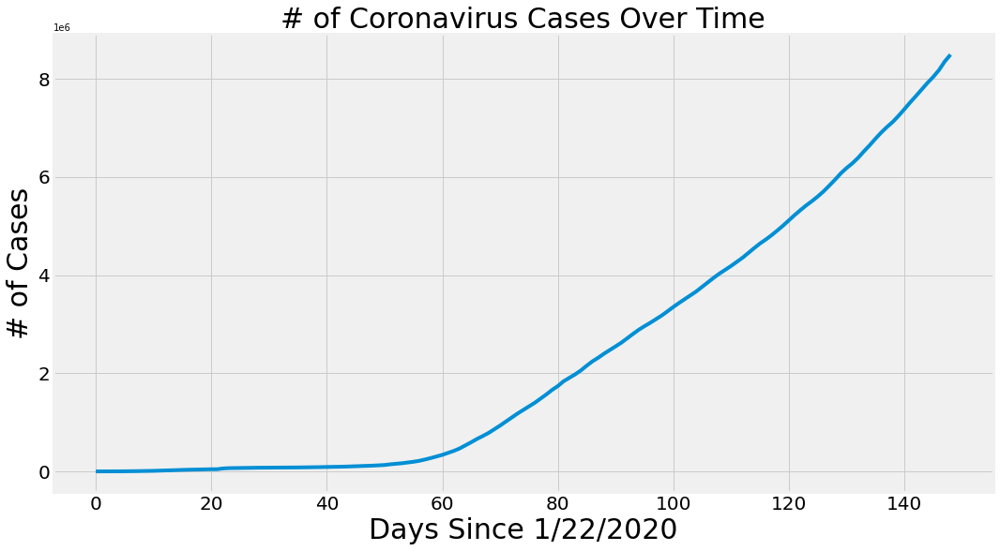

In [33]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, world_cases)
plt.title('# of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

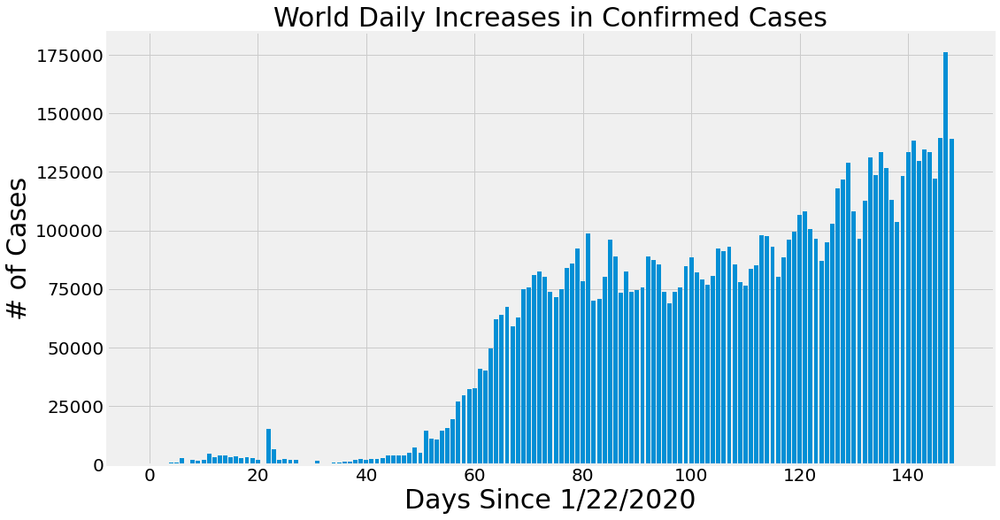

In [34]:
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, world_daily_increase)
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Text(0.5, 1.0, 'Daily Total Confirmed - Major Countries')

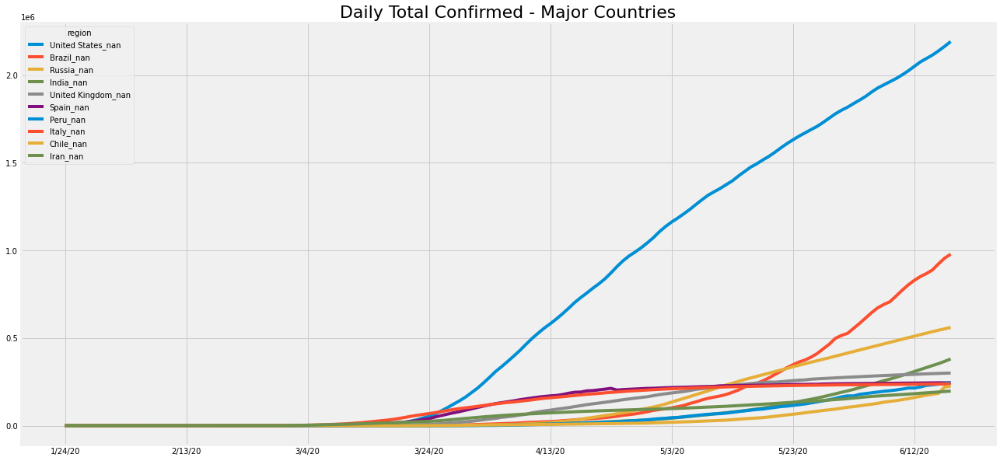

In [35]:
import matplotlib.pyplot as plt
p=ts.reindex(ts.max().sort_values(ascending=False).index, axis=1)
p.iloc[2:,:10].plot(figsize=(20,10)).set_title('Daily Total Confirmed - Major Countries',fontdict={'fontsize': 22})

Text(0.5, 1.0, 'Daily Total Death - Major areas')

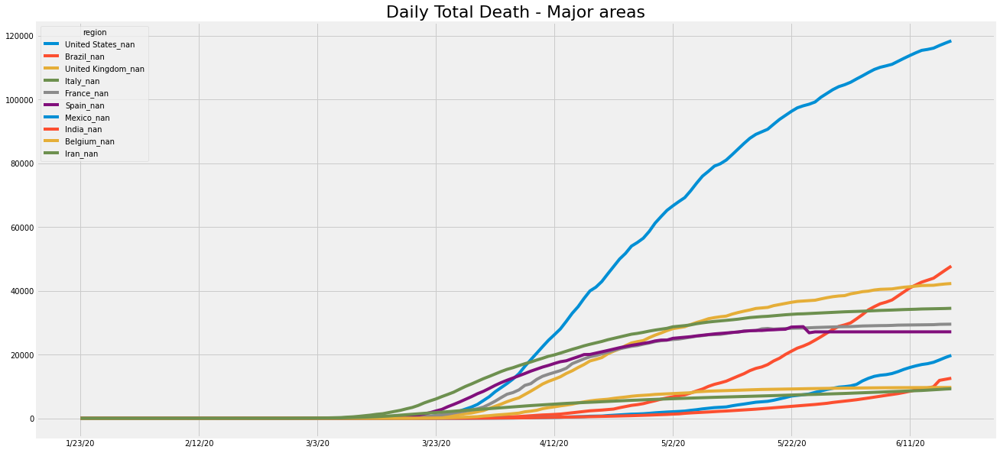

In [36]:
p_d=ts_d.reindex(ts_d.max().sort_values(ascending=False).index, axis=1)
p_d.iloc[1:,:10].plot(figsize=(20,10)).set_title('Daily Total Death - Major areas',fontdict={'fontsize': 22})

Text(0.5, 1.0, 'Daily Total Recoverd - Major areas')

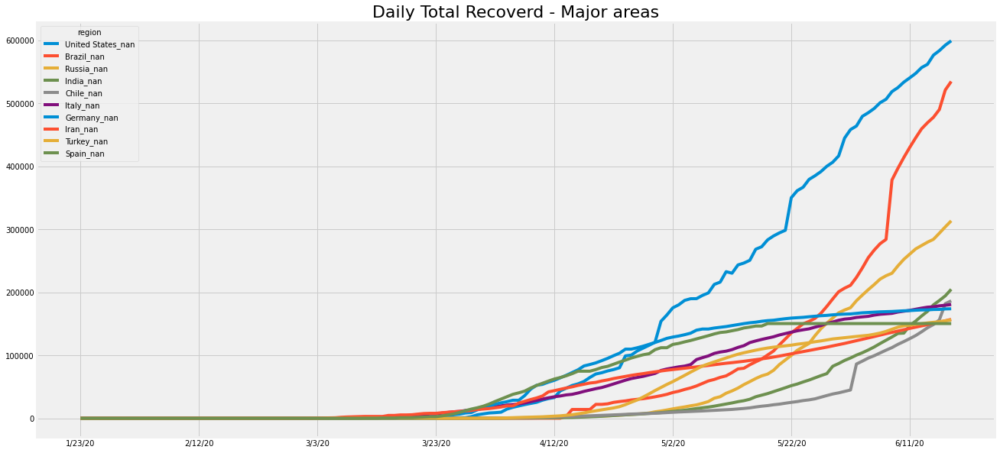

In [37]:
p_r=ts_rec.reindex(ts_rec.max().sort_values(ascending=False).index, axis=1)
p_r.iloc[1:,:10].plot(figsize=(20,10)).set_title('Daily Total Recoverd - Major areas',fontdict={'fontsize': 22})

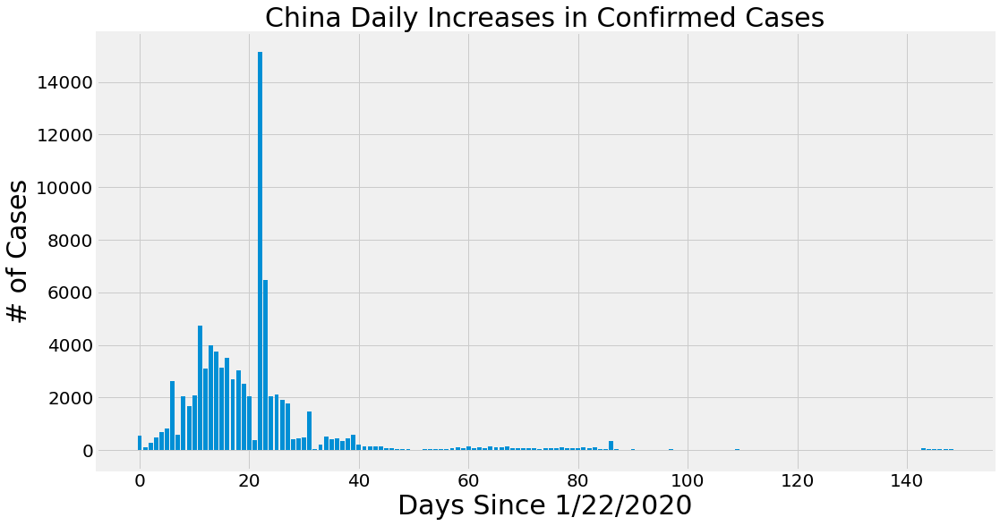

In [38]:
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, china_daily_increase)
plt.title('China Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

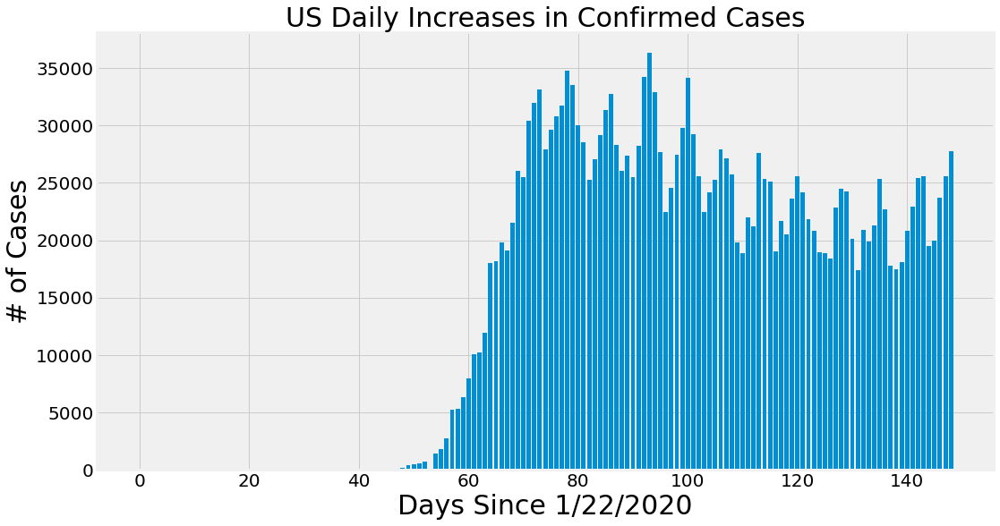

In [39]:
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, us_daily_increase)
plt.title('US Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

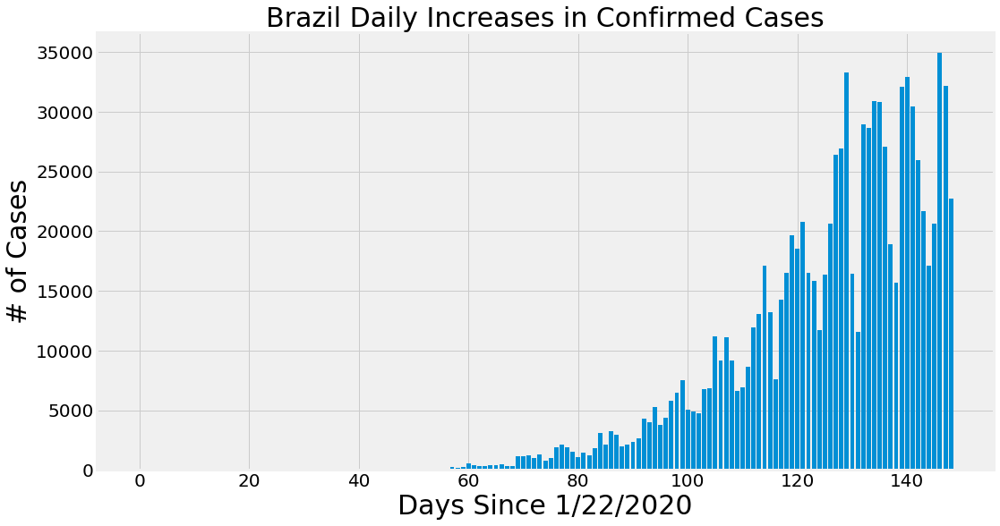

In [40]:
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, brazil_daily_increase)
plt.title('Brazil Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

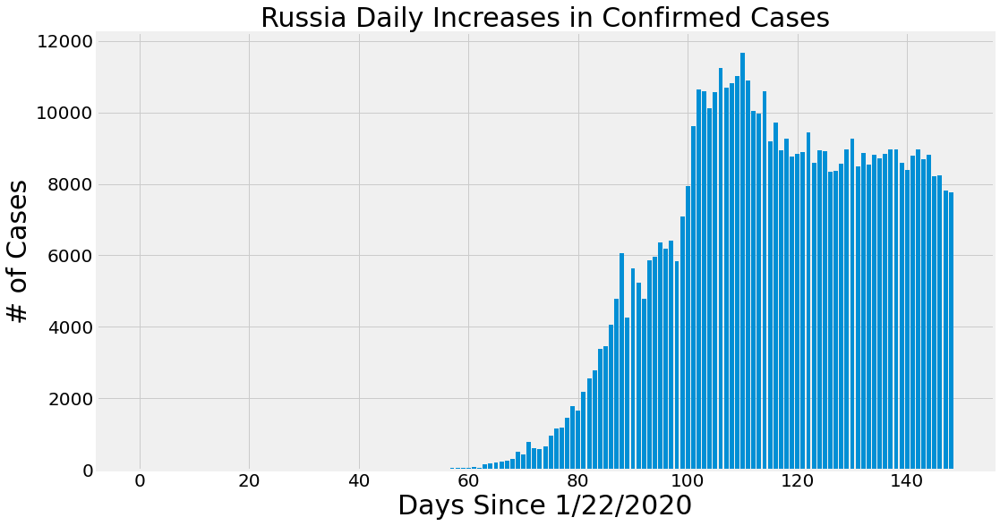

In [41]:
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, russia_daily_increase)
plt.title('Russia Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

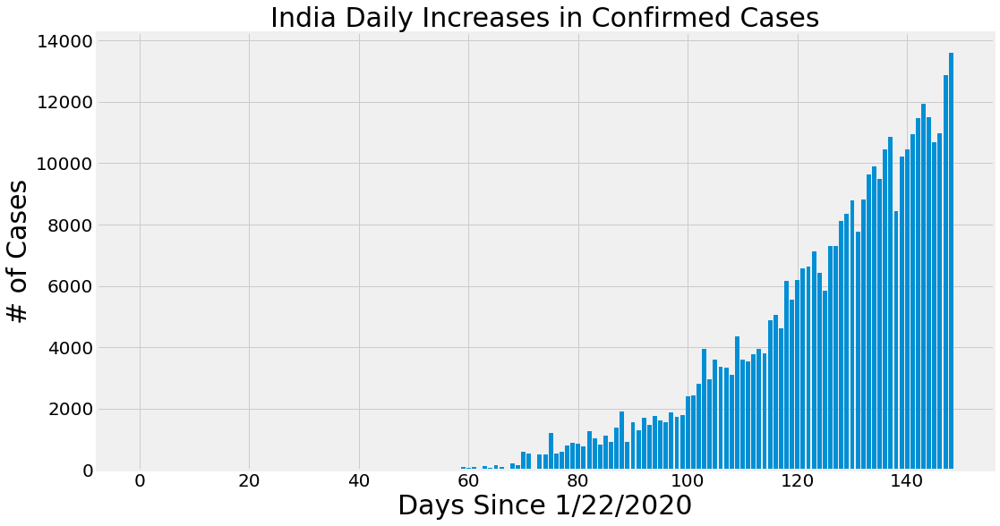

In [42]:
plt.figure(figsize=(16, 9))
plt.bar(adjusted_dates, india_daily_increase)
plt.title('India Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

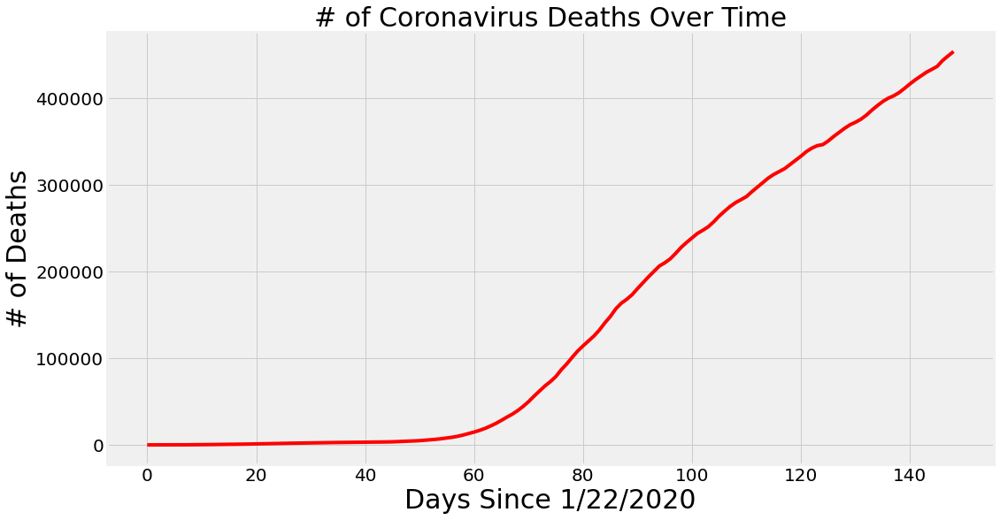

In [43]:
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, total_deaths, color='red')
plt.title('# of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Deaths', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

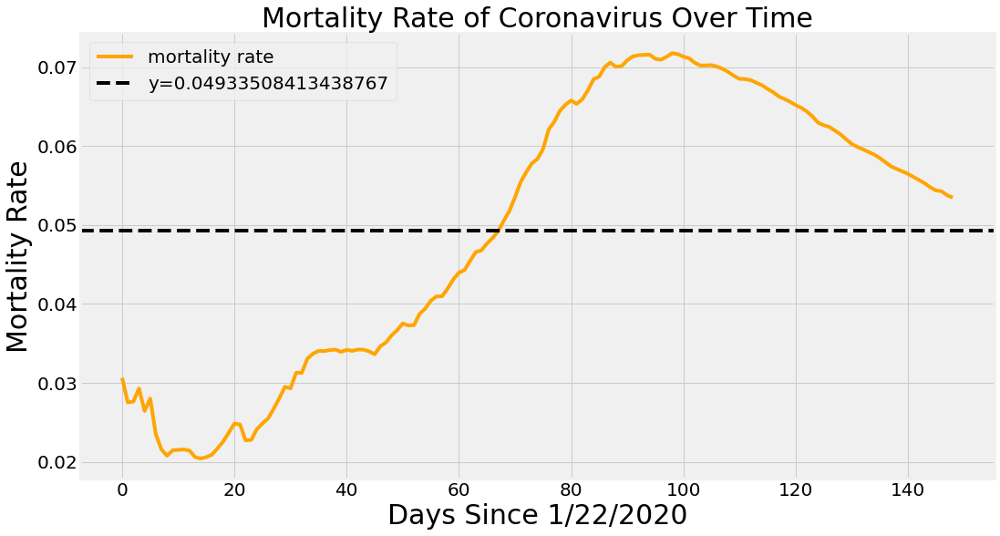

In [44]:
mean_mortality_rate = np.mean(mortality_rate)
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, mortality_rate, color='orange')
plt.axhline(y = mean_mortality_rate,linestyle='--', color='black')
plt.title('Mortality Rate of Coronavirus Over Time', size=30)
plt.legend(['mortality rate', 'y='+str(mean_mortality_rate)], prop={'size': 20})
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Mortality Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

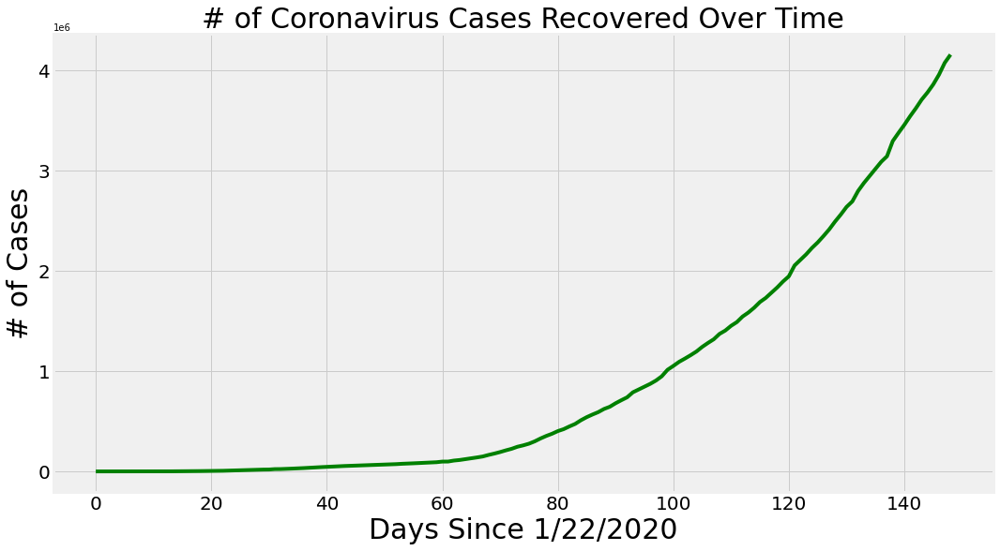

In [45]:
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, total_recovered, color='green')
plt.title('# of Coronavirus Cases Recovered Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

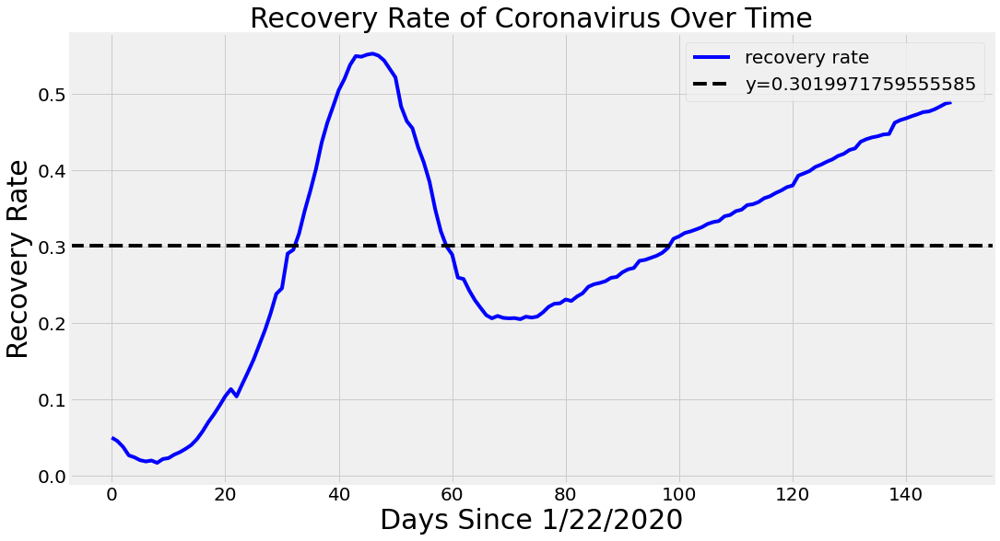

In [46]:
mean_recovery_rate = np.mean(recovery_rate)
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, recovery_rate, color='blue')
plt.axhline(y = mean_recovery_rate,linestyle='--', color='black')
plt.title('Recovery Rate of Coronavirus Over Time', size=30)
plt.legend(['recovery rate', 'y='+str(mean_recovery_rate)], prop={'size': 20})
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Recovery Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

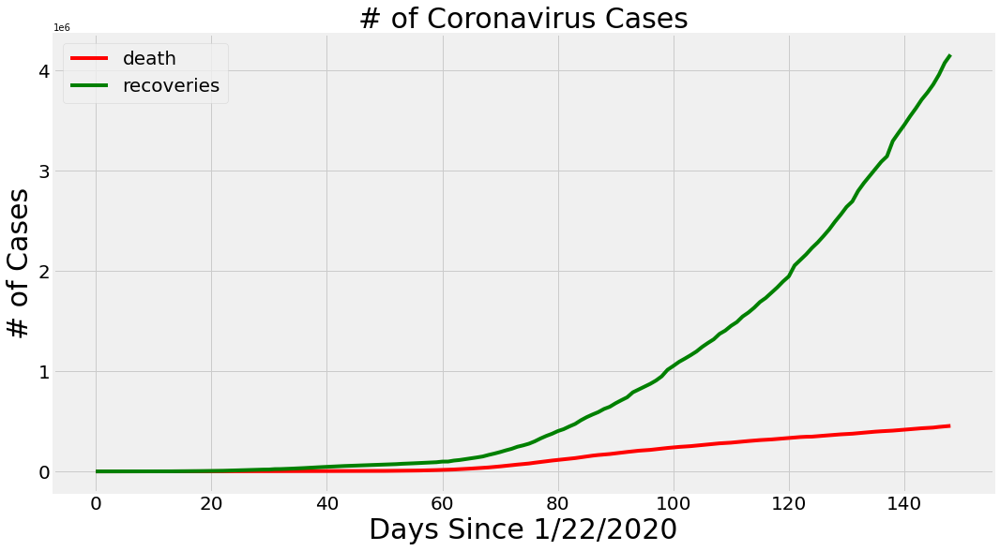

In [47]:
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, total_deaths, color='r')
plt.plot(adjusted_dates, total_recovered, color='green')
plt.legend(['death', 'recoveries'], loc='best', fontsize=20)
plt.title('# of Coronavirus Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

## **MAP**

In [48]:
mymap = folium.Map(tiles='cartodbpositron')
mymap.save(outfile='infinite_scroll.html')

In [49]:
mymap_fix_boundary = folium.Map(min_zoom=2, max_bounds=True, tiles='cartodbpositron')
mymap_fix_boundary.save(outfile='fix_boundary.html')

In [50]:
max_colour = max(joined_df['log_Confirmed'])
min_colour = min(joined_df['log_Confirmed'])
cmap = cm.linear.YlOrRd_09.scale(min_colour, max_colour)
joined_df['colour'] = joined_df['log_Confirmed'].map(cmap)

In [51]:
country_list = joined_df['Country/Region'].unique().tolist()
country_idx = range(len(country_list))

style_dict = {}
for i in country_idx:
    country = country_list[i]
    result = joined_df[joined_df['Country/Region'] == country]
    inner_dict = {}
    for _, r in result.iterrows():
        inner_dict[r['date_sec']] = {'color': r['colour'], 'opacity': 0.7}
    style_dict[str(i)] = inner_dict

In [52]:
countries_df = joined_df[['geometry']]
countries_gdf = gpd.GeoDataFrame(countries_df)
countries_gdf = countries_gdf.drop_duplicates().reset_index()

In [53]:
from folium.plugins import TimeSliderChoropleth

slider_map = folium.Map(min_zoom=2, max_bounds=True,tiles='cartodbpositron')

_ = TimeSliderChoropleth(
    data=countries_gdf.to_json(),
    styledict=style_dict,

).add_to(slider_map)

_ = cmap.add_to(slider_map)
cmap.caption = "Log of number of confirmed cases"
slider_map.save(outfile='TimeSliderChoropleth.html')

*Use the slider to change the Dates*

In [54]:
slider_map

**Overall Country Wise Data**

In [55]:
unique_countries =  list(confirmed_df['Country/Region'].unique())

In [56]:
country_confirmed_cases = []
country_death_cases = [] 
country_recovery_cases = []
country_mortality_rate = []
country_recovery_rate = []

no_cases = []
for i in unique_countries:
    cases = confirmed_df[confirmed_df['Country/Region']==i]['6/14/20'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    
# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = confirmed_df[confirmed_df['Country/Region']==unique_countries[i]]['6/14/20'].sum()
    country_death_cases.append(deaths_df[deaths_df['Country/Region']==unique_countries[i]]['6/14/20'].sum())
    country_recovery_cases.append(recoveries_df[recoveries_df['Country/Region']==unique_countries[i]]['6/14/20'].sum())
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])
    country_recovery_rate.append(country_recovery_cases[i]/country_confirmed_cases[i])


In [57]:
country_df = pd.DataFrame({'Country Name': unique_countries, 'Number of Confirmed Cases': country_confirmed_cases,
                          'Number of Deaths': country_death_cases, 'Number of Recoveries' : country_recovery_cases,
                          'Mortality Rate': country_mortality_rate, 'Recovery Rate': country_recovery_rate})
# number of cases per country/region

country_df.style.background_gradient(cmap='Greens')

,Country Name,Number of Confirmed Cases,Number of Deaths,Number of Recoveries,Mortality Rate,Recovery Rate
0,United States,2094058,115732,561816,0.055267,0.268291
1,Brazil,867624,43332,469141,0.049943,0.540719
2,Russia,528267,6938,279536,0.013134,0.529157
3,India,332424,9520,169798,0.028638,0.510787
4,United Kingdom,297342,41783,1283,0.140522,0.004315
5,Spain,243928,27136,150376,0.111246,0.616477
6,Italy,236989,34345,176370,0.144922,0.744212
7,Peru,229736,6688,115579,0.029112,0.503095
8,France,194153,29410,72982,0.151478,0.375899
9,Germany,187518,8801,172089,0.046934,0.917720


In [58]:
unique_provinces =  list(confirmed_df['Province/State'].unique())

In [59]:
province_confirmed_cases = []
province_country = [] 
province_death_cases = [] 
province_recovery_cases = []
province_mortality_rate = [] 
province_recovery_rate = []

no_cases = [] 
for i in unique_provinces:
    cases = confirmed_df[confirmed_df['Province/State']==i]['6/14/20'].sum()
    if cases > 0:
        province_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
 
# remove areas with no confirmed cases
for i in no_cases:
    unique_provinces.remove(i)
    
unique_provinces = [k for k, v in sorted(zip(unique_provinces, province_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_provinces)):
    province_confirmed_cases[i] = confirmed_df[confirmed_df['Province/State']==unique_provinces[i]]['6/14/20'].sum()
    province_country.append(confirmed_df[confirmed_df['Province/State']==unique_provinces[i]]['Country/Region'].unique()[0])
    province_death_cases.append(deaths_df[deaths_df['Province/State']==unique_provinces[i]]['6/14/20'].sum())
    province_recovery_cases.append(recoveries_df[recoveries_df['Province/State']==unique_provinces[i]]['6/14/20'].sum())
    province_mortality_rate.append(province_death_cases[i]/province_confirmed_cases[i])
    province_recovery_rate.append(province_recovery_cases[i]/province_confirmed_cases[i])


In [60]:
# number of cases per province/state/city
province_df = pd.DataFrame({'Province/State Name': unique_provinces, 'Country': province_country, 'Number of Confirmed Cases': province_confirmed_cases,
                          'Number of Deaths': province_death_cases, 'Number of Recoveries' : province_recovery_cases,
                          'Mortality Rate': province_mortality_rate, 'Recovery Rate': province_recovery_rate})
# number of cases per country/region

province_df.style.background_gradient(cmap='Greens')

,Province/State Name,Country,Number of Confirmed Cases,Number of Deaths,Number of Recoveries,Mortality Rate,Recovery Rate
0,Hubei,China,68135,4512,63623,0.066221,0.933779
1,Quebec,Canada,53952,5222,0,0.096790,0.000000
2,Ontario,Canada,33806,2590,0,0.076614,0.000000
3,Alberta,Canada,7433,150,0,0.020180,0.000000
4,New South Wales,Australia,3131,48,2766,0.015331,0.883424
5,British Columbia,Canada,2709,168,0,0.062016,0.000000
6,Mayotte,France,2298,29,1790,0.012620,0.778938
7,Victoria,Australia,1732,19,1661,0.010970,0.959007
8,Guangdong,China,1625,8,1590,0.004923,0.978462
9,Henan,China,1276,22,1254,0.017241,0.982759


In [61]:
nan_indices = [] 

# handle nan if there is any, it is usually a float: float('nan')

for i in range(len(unique_provinces)):
    if type(unique_provinces[i]) == float:
        nan_indices.append(i)

unique_provinces = list(unique_provinces)
province_confirmed_cases = list(province_confirmed_cases)

for i in nan_indices:
    unique_provinces.pop(i)
    province_confirmed_cases.pop(i)

### **COUNTRY BASED PREDICITONS USING KALMAN FILTER**

**Kalman Filter Model**

In [62]:
# Create data for R script
ts_r=ts.reset_index()
ts_r=ts_r.rename(columns = {'index':'date'})
ts_r['date']=pd.to_datetime(ts_r['date'] ,errors ='coerce')
ts_r.to_csv(r'/content/drive/My Drive/ts_r.csv')

In [63]:
import rpy2
%load_ext rpy2.ipython

/usr/local/lib/python3.6/dist-packages/rpy2/robjects/pandas2ri.py:14: FutureWarning:

pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.

/usr/local/lib/python3.6/dist-packages/rpy2/robjects/pandas2ri.py:34: UserWarning:

pandas >= 1.0 is not supported.



In [64]:
%%R
install.packages('pracma')
install.packages('reshape')

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/pracma_2.2.9.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 400551 bytes (391 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write

In [65]:
%%R
require(pracma)
require(Metrics)
require(readr)
all<- read_csv("/content/drive/My Drive/ts_r.csv")
all$X1<-NULL
date<-all[,1]
date[nrow(date) + 1,1] <-all[nrow(all),1]+1
pred_all<-NULL
for (n in 2:ncol(all)-1) {
  Y<-ts(data = all[n+1], start = 1, end =nrow(all)+1)  
  sig_w<-0.01
  w<-sig_w*randn(1,100) # acceleration which denotes the fluctuation (Q/R) rnorm(100, mean = 0, sd = 1)
  sig_v<-0.01
  v<-sig_v*randn(1,100)   
  t<-0.45
  phi<-matrix(c(1,0,t,1),2,2)
  gama<-matrix(c(0.5*t^2,t),2,1)
  H<-matrix(c(1,0),1,2)
  #Kalman
  x0_0<-p0_0<-matrix(c(0,0),2,1)
  p0_0<-matrix(c(1,0,0,1),2,2)
  Q<-0.01
  R<-0.01
  X<-NULL
  X2<-NULL
  pred<-NULL
  for (i in 0:nrow(all)) {
    namp <-paste("p", i+1,"_",i, sep = "")
    assign(namp, phi%*%(get(paste("p", i,"_",i, sep = "")))%*%t(phi)+gama%*%Q%*%t(gama))
    namk <- paste("k", i+1, sep = "")
    assign(namk,get(paste("p", i+1,"_",i, sep = ""))%*%t(H)%*%(1/(H%*%get(paste("p", i+1,"_",i, sep = ""))%*%t(H)+R)))
    namx <- paste("x", i+1,"_",i, sep = "")
    assign(namx,phi%*%get(paste("x", i,"_",i, sep = "")))
    namE <- paste("E", i+1, sep = "")
    assign(namE,Y[i+1]-H%*%get(paste("x", i+1,"_",i, sep = "")))
    namx2 <- paste("x", i+1,"_",i+1, sep = "")
    assign(namx2,get(paste("x", i+1,"_",i, sep = ""))+get(paste("k", i+1, sep = ""))%*%get(paste("E", i+1, sep = "")))
    namp2 <- paste("p", i+1,"_",i+1, sep = "")
    assign(namp2,(p0_0-get(paste("k", i+1, sep = ""))%*%H)%*%get(paste("p", i+1,"_",i, sep = "")))
    X<-rbind(X,get(paste("x", i+1,"_",i,sep = ""))[1])
    X2<-rbind(X2,get(paste("x", i+1,"_",i,sep = ""))[2])
    if(i>2){
      remove(list=(paste("p", i-1,"_",i-2, sep = "")))
      remove(list=(paste("k", i-1, sep = "")))
      remove(list=(paste("E", i-1, sep = "")))
      remove(list=(paste("p", i-2,"_",i-2, sep = "")))
      remove(list=(paste("x", i-1,"_",i-2, sep = "")))
      remove(list=(paste("x", i-2,"_",i-2, sep = "")))}
  }
  pred<-NULL
  pred<-cbind(Y,X,round(X2,4))
  pred<-as.data.frame(pred)
  pred$region<-colnames(all[,n+1])
  pred$date<-date$date
  pred$actual<-rbind(0,(cbind(pred[2:nrow(pred),1])/pred[1:nrow(pred)-1,1]-1)*100)
  pred$predict<-rbind(0,(cbind(pred[2:nrow(pred),2])/pred[1:nrow(pred)-1,2]-1)*100)
  pred$pred_rate<-(pred$X/pred$Y-1)*100
  pred$X2_change<-rbind(0,(cbind(pred[2:nrow(pred),3]-pred[1:nrow(pred)-1,3])))
  pred_all<-rbind(pred_all,pred)
}
pred_all<-cbind(pred_all[,4:5],pred_all[,1:3])
names(pred_all)[5]<-"X2"
pred_all=pred_all[with( pred_all, order(region, date)), ]
pred_all<-pred_all[,3:5]

R[write to console]: Loading required package: pracma

R[write to console]: Loading required package: Metrics

R[write to console]: Loading required package: readr

R[write to console]: Parsed with column specification:
cols(
  .default = col_double(),
  date = col_date(format = "")
)

R[write to console]: See spec(...) for full column specifications.



In [66]:
p=%R pred_all

In [67]:
############ Merge R output due to package problem
t=ts_d
t=t.stack().reset_index(name='confirmed')
t.columns=['date', 'region','confirmed']
t['date']=pd.to_datetime(t['date'] ,errors ='coerce')
t=t.sort_values(['region', 'date'])

temp=t.iloc[:,:3]
temp=temp.reset_index(drop=True)
for i in range(1,len(t)+1):
  if(temp.iloc[i,1] is not temp.iloc[i-1,1]):
    temp.loc[len(temp)+1] = [temp.iloc[i-1,0]+ pd.DateOffset(1),temp.iloc[i-1,1], 0] 
temp=temp.sort_values(['region', 'date'])
temp=temp.reset_index(drop=True)
temp['Y']=p['Y'].values
temp['X']=p['X'].values
temp['X2']=p['X2'].values

**Weather Data**

In [69]:
w=pd.read_csv('/content/drive/My Drive/w.csv', sep=',', encoding='latin1')
w['date']=pd.to_datetime(w['date'],format='%d/%m/%Y')
#w['date']=pd.to_datetime(w['date'],errors ='coerce')

w_forecast=pd.read_csv('/content/drive/My Drive/w_forecast.csv', sep=',', encoding='latin1')
w_forecast['date']=pd.to_datetime(w_forecast['date'],format='%d/%m/%Y')

**Build Train Set Data Structure**

In [70]:
t=ts
t=t.stack().reset_index(name='confirmed')
t.columns=['date', 'region','confirmed']
t['date']=pd.to_datetime(t['date'] ,errors ='coerce')
t=t.sort_values(['region', 'date'])

# Add 1 Future day for prediction
t=t.reset_index(drop=True)
for i in range(1,len(t)+1):
  if(t.iloc[i,1] is not t.iloc[i-1,1]):
    t.loc[len(t)+1] = [t.iloc[i-1,0]+ pd.DateOffset(1),t.iloc[i-1,1], 0] 
t=t.sort_values(['region', 'date'])
t=t.reset_index(drop=True)

In [71]:
t['1_day_change']=t['3_day_change']=t['7_day_change']=t['1_day_change_rate']=t['3_day_change_rate']=t['7_day_change_rate']=t['last_day']=0
for i in range(1,len(t)):
  if(t.iloc[i,1] is t.iloc[i-2,1]):
    t.iloc[i,3]=t.iloc[i-1,2]-t.iloc[i-2,2]
    t.iloc[i,6]=(t.iloc[i-1,2]/t.iloc[i-2,2]-1)*100
    t.iloc[i,9]=t.iloc[i-1,2]
  if(t.iloc[i,1] is t.iloc[i-4,1]):
    t.iloc[i,4]=t.iloc[i-1,2]-t.iloc[i-4,2]
    t.iloc[i,7]=(t.iloc[i-1,2]/t.iloc[i-4,2]-1)*100
  if(t.iloc[i,1] is t.iloc[i-8,1]):
    t.iloc[i,5]=t.iloc[i-1,2]-t.iloc[i-8,2]
    t.iloc[i,8]=(t.iloc[i-1,2]/t.iloc[i-8,2]-1)*100
t=t.fillna(0)  
t=t.merge(temp[['date','region', 'X']],how='left',on=['date','region'])
t=t.rename(columns = {'X':'kalman_prediction'}) 
t=t.replace([np.inf, -np.inf], 0)
t['kalman_prediction']=round(t['kalman_prediction'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning:

invalid value encountered in long_scalars

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning:

invalid value encountered in long_scalars

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning:

invalid value encountered in long_scalars

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning:

divide by zero encountered in long_scalars

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning:

divide by zero encountered in long_scalars

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning:

divide by zero encountered in long_scalars



In [72]:
train=t.merge(confirmed_df[['region',' Population ']],how='left',on='region')
train=train.rename(columns = {' Population ':'population'})
train['population']=train['population'].str.replace(r" ", '')
train['population']=train['population'].str.replace(r",", '')
train['population']=train['population'].fillna(1)
train['population']=train['population'].astype('int32')
train['infected_rate'] =train['last_day']/train['population']*10000
train=train.merge(w,how='left',on=['date','region'])
train=train.sort_values(['region', 'date'])
### fill missing weather 
for i in range(0,len(train)):
  if(np.isnan(train.iloc[i,13])):
    if(train.iloc[i,1] is train.iloc[i-1,1]):
      train.iloc[i,13]=train.iloc[i-1,13]
      train.iloc[i,14]=train.iloc[i-1,14]

**Kalman 1 day Prediction with Evaluation**

        region           mse          mae
143  India_nan  1.026249e+09  3168.979866


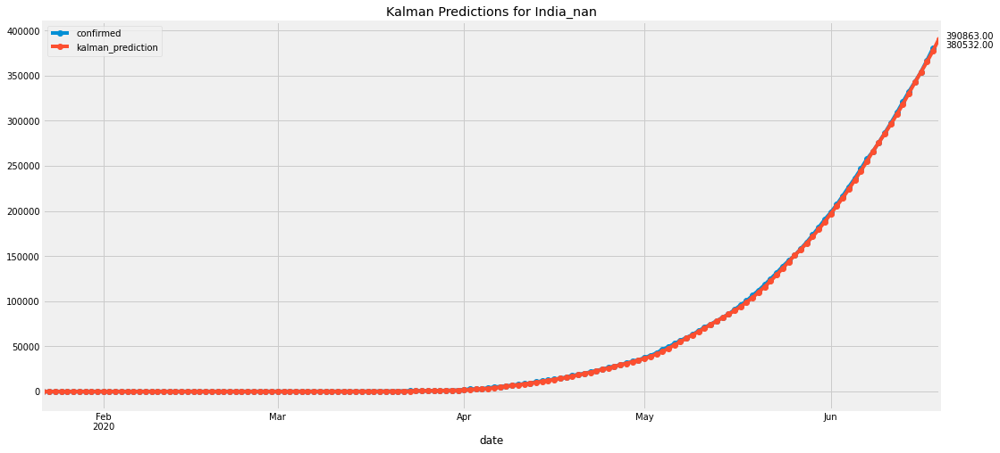

In [73]:
# Select region
region='India_nan'

evaluation=pd.DataFrame(columns=['region','mse','mae'])
place=0
for i in range(1,len(t)):
  if(t.iloc[i,1] is not t.iloc[i-1,1]):
    ex=np.array(t.iloc[i-len(ts):i,10])
    pred=np.array(t.iloc[i-len(ts):i,2])
    evaluation=evaluation.append({'region': t.iloc[i-1,1], 'mse': np.power((ex - pred),2).mean(),'mae': (abs(ex - pred)).mean()}, ignore_index=True)
p=t[t['region']==region][['date','region','confirmed','kalman_prediction']]
p.iloc[len(p)-1,2]=None
p=p.set_index(['date'])
p.iloc[:,1:].plot(marker='o',figsize=(16,8)).set_title('Kalman Predictions for {}'.format(p.iloc[0,0]))
print(evaluation[evaluation['region']==p.iloc[0,0]])
for var in (p['confirmed'], p['kalman_prediction']):
    plt.annotate('%0.2f' % var.max(), xy=(1, var.max()), xytext=(8, 0), 
                 xycoords=('axes fraction', 'data'), textcoords='offset points')

plt.show()

                region           mse           mae
256  United States_nan  3.284211e+10  18175.899329


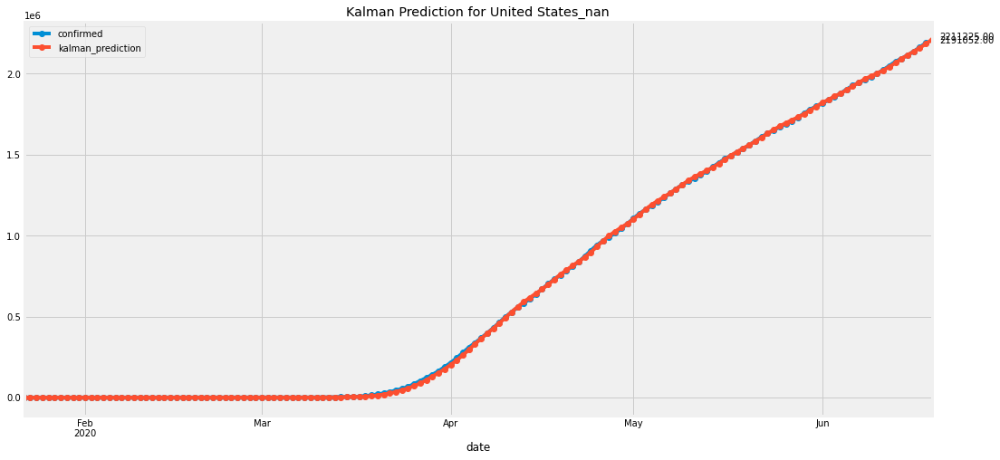

In [74]:
# Select region
region='United States_nan'

evaluation=pd.DataFrame(columns=['region','mse','mae'])
place=0
for i in range(1,len(t)):
  if(t.iloc[i,1] is not t.iloc[i-1,1]):
    ex=np.array(t.iloc[i-len(ts):i,10])
    pred=np.array(t.iloc[i-len(ts):i,2])
    evaluation=evaluation.append({'region': t.iloc[i-1,1], 'mse': np.power((ex - pred),2).mean(),'mae': (abs(ex - pred)).mean()}, ignore_index=True)
p=t[t['region']==region][['date','region','confirmed','kalman_prediction']]
p.iloc[len(p)-1,2]=None
p=p.set_index(['date'])
p.iloc[:,1:].plot(marker='o',figsize=(16,8)).set_title('Kalman Prediction for {}'.format(p.iloc[0,0]))
print(evaluation[evaluation['region']==p.iloc[0,0]])
for var in (p['confirmed'], p['kalman_prediction']):
    plt.annotate('%0.2f' % var.max(), xy=(1, var.max()), xytext=(8, 0), 
                 xycoords=('axes fraction', 'data'), textcoords='offset points')

plt.show()

**Kalman X Days Ahead Prediction**

In [75]:
%%R
install.packages('reshape')

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/reshape_0.8.8.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 42558 bytes (41 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write 

In [76]:
%%R
require(pracma)
require(Metrics)
require(readr)
library(reshape)
all<- read_csv("/content/drive/My Drive/ts_r.csv")
all$X1<-NULL
for (i in 1:30) { # Set i days prediction
  if( i>1) {all<-all_new}
  date<-all[,1]
  date[nrow(date) + 1,1] <-all[nrow(all),1]+1
  pred_all<-NULL
  for (n in 2:ncol(all)-1) {
    Y<-ts(data = all[n+1], start = 1, end =nrow(all)+1)  
    sig_w<-0.01
    w<-sig_w*randn(1,100) # acceleration which denotes the fluctuation (Q/R) rnorm(100, mean = 0, sd = 1)
    sig_v<-0.01
    v<-sig_v*randn(1,100)  
    t<-0.45
    phi<-matrix(c(1,0,t,1),2,2)
    gama<-matrix(c(0.5*t^2,t),2,1)
    H<-matrix(c(1,0),1,2)
    #Kalman
    x0_0<-p0_0<-matrix(c(0,0),2,1)
    p0_0<-matrix(c(1,0,0,1),2,2)
    Q<-0.01
    R<-0.01
    X<-NULL
    X2<-NULL
    pred<-NULL
    for (i in 0:nrow(all)) {
      namp <-paste("p", i+1,"_",i, sep = "")
      assign(namp, phi%*%(get(paste("p", i,"_",i, sep = "")))%*%t(phi)+gama%*%Q%*%t(gama))
      namk <- paste("k", i+1, sep = "")
      assign(namk,get(paste("p", i+1,"_",i, sep = ""))%*%t(H)%*%(1/(H%*%get(paste("p", i+1,"_",i, sep = ""))%*%t(H)+R)))
      namx <- paste("x", i+1,"_",i, sep = "")
      assign(namx,phi%*%get(paste("x", i,"_",i, sep = "")))
      namE <- paste("E", i+1, sep = "")
      assign(namE,Y[i+1]-H%*%get(paste("x", i+1,"_",i, sep = "")))
      namx2 <- paste("x", i+1,"_",i+1, sep = "")
      assign(namx2,get(paste("x", i+1,"_",i, sep = ""))+get(paste("k", i+1, sep = ""))%*%get(paste("E", i+1, sep = "")))
      namp2 <- paste("p", i+1,"_",i+1, sep = "")
      assign(namp2,(p0_0-get(paste("k", i+1, sep = ""))%*%H)%*%get(paste("p", i+1,"_",i, sep = "")))
      X<-rbind(X,get(paste("x", i+1,"_",i,sep = ""))[1])
      X2<-rbind(X2,get(paste("x", i+1,"_",i,sep = ""))[2])
      if(i>2){
        remove(list=(paste("p", i-1,"_",i-2, sep = "")))
        remove(list=(paste("k", i-1, sep = "")))
        remove(list=(paste("E", i-1, sep = "")))
        remove(list=(paste("p", i-2,"_",i-2, sep = "")))
        remove(list=(paste("x", i-1,"_",i-2, sep = "")))
        remove(list=(paste("x", i-2,"_",i-2, sep = "")))}
    } 
    pred<-NULL
    pred<-cbind(Y,X,round(X2,4))
    pred<-as.data.frame(pred)
    pred$region<-colnames(all[,n+1])
    pred$date<-date$date
    pred$actual<-rbind(0,(cbind(pred[2:nrow(pred),1])/pred[1:nrow(pred)-1,1]-1)*100)
    pred$predict<-rbind(0,(cbind(pred[2:nrow(pred),2])/pred[1:nrow(pred)-1,2]-1)*100)
    pred$pred_rate<-(pred$X/pred$Y-1)*100
    pred$X2_change<-rbind(0,(cbind(pred[2:nrow(pred),3]-pred[1:nrow(pred)-1,3])))
    pred_all<-rbind(pred_all,pred)
  }
  pred_all<-cbind(pred_all[,4:5],pred_all[,1:3])
  names(pred_all)[5]<-"X2"
  pred_all<-pred_all[,1:5]
       
pred_all_today=pred_all[with( pred_all, order(region, date)), ]
all_new=all
#all_new[nrow(all_new),1]<-all_new[nrow(all),1]+1
temp<-with(pred_all_today, pred_all_today[date == all[nrow(all),1]+1, ])
temp<-cbind(temp[,1:2],temp[,4])
temp2<-reshape(temp, direction = "wide", idvar = "date", timevar = "region")
rand_num<-runif(ncol(temp2)-1, 0.9, 1.05)
temp2[,2:ncol(temp2)]<-temp2[,2:ncol(temp2)]*rand_num
colnames(temp2)=colnames(all_new)
all_new<-rbind(all_new,temp2)
all_new[,2:ncol(all_new)]<-round(all_new[,2:ncol(all_new)])
for (i in 2:ncol(all_new)) {
  all_new[nrow(all_new),i]=max(all_new[nrow(all_new)-1,i],all_new[nrow(all_new),i])}
}

R[write to console]: Loading required package: Metrics

R[write to console]: Parsed with column specification:
cols(
  .default = col_double(),
  date = col_date(format = "")
)

R[write to console]: See spec(...) for full column specifications.



In [77]:
all_new=%R all_new

In [78]:
all_new['date']=pd.to_datetime(all_new['date'],unit='d')

Text(0.5, 1.0, 'Kalman Prediction for - India_nan')

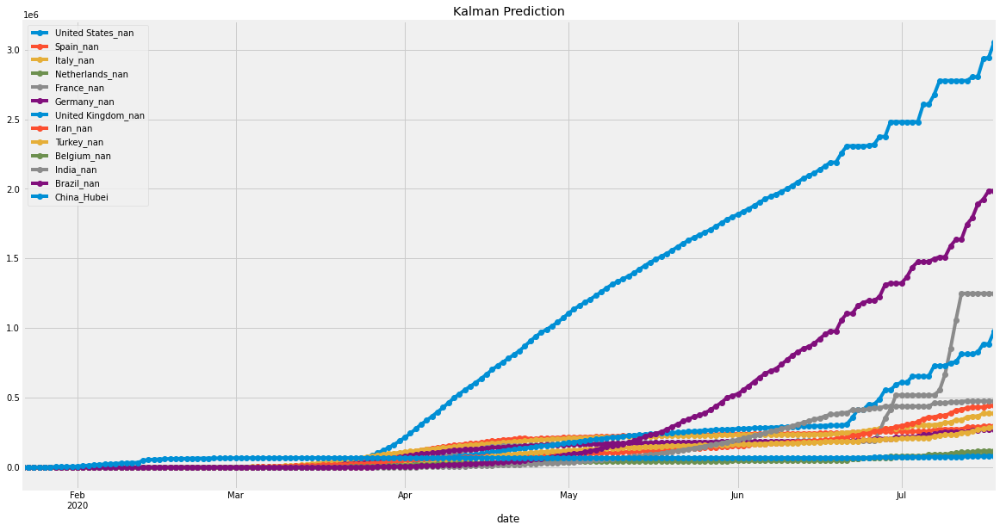

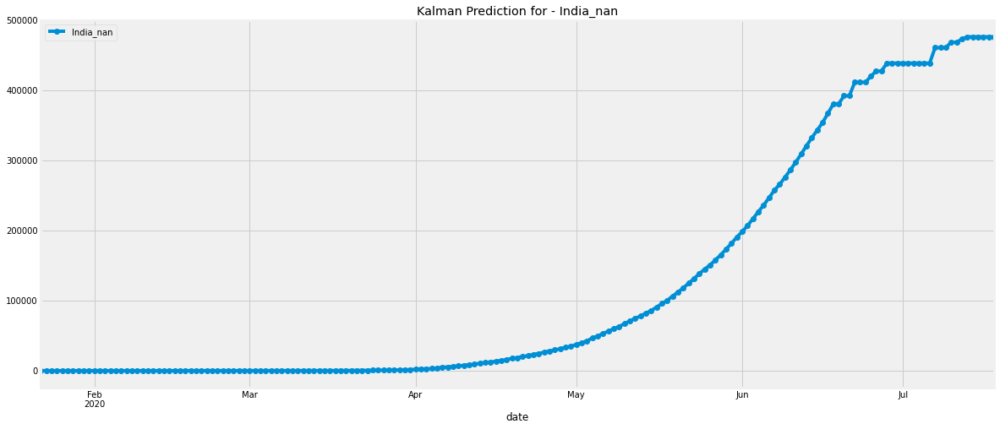

In [79]:
region=['date','United States_nan', 'Spain_nan',
       'Italy_nan', 'Netherlands_nan', 'France_nan',
       'Germany_nan', 'United Kingdom_nan', 'Iran_nan',
       'Turkey_nan', 'Belgium_nan', 'India_nan', 
        'Brazil_nan', 'China_Hubei']
p_kalman=all_new[region]
#p=all_new
#p.iloc[len(p)-1,2]=None
p_kalman=p_kalman.set_index(['date'])
p_kalman.iloc[:,:].plot(marker='o',figsize=(18,10)).set_title('Kalman Prediction')

p_kalman2=all_new[['date','India_nan']]
p_kalman2=p_kalman2.set_index(['date'])
p_kalman2.iloc[:,:].plot(marker='o',figsize=(18,8)).set_title('Kalman Prediction for - {}'.format(p_kalman2.columns[0]))

In [80]:
from google.colab import files
all_new.to_csv('Covid19_predictions.csv')
files.download("Covid19_predictions.csv")

##**ARIMA MODEL**

In [81]:
df=pd.read_csv("/content/drive/My Drive/ts_r.csv",usecols=[1])

In [82]:
total_cases=pd.DataFrame(world_cases)

In [83]:
data=pd.concat([df,total_cases],axis=1,sort=False)

In [84]:
data = data.rename(columns={0: 'Cases'})

In [86]:
#data.reset_index(inplace=True)
data['date'] = pd.to_datetime(data['date'])
data = data.set_index('date')

In [87]:
data.head()

,Cases
date,
2020-01-22,555
2020-01-23,654
2020-01-24,941
2020-01-25,1434
2020-01-26,2118


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



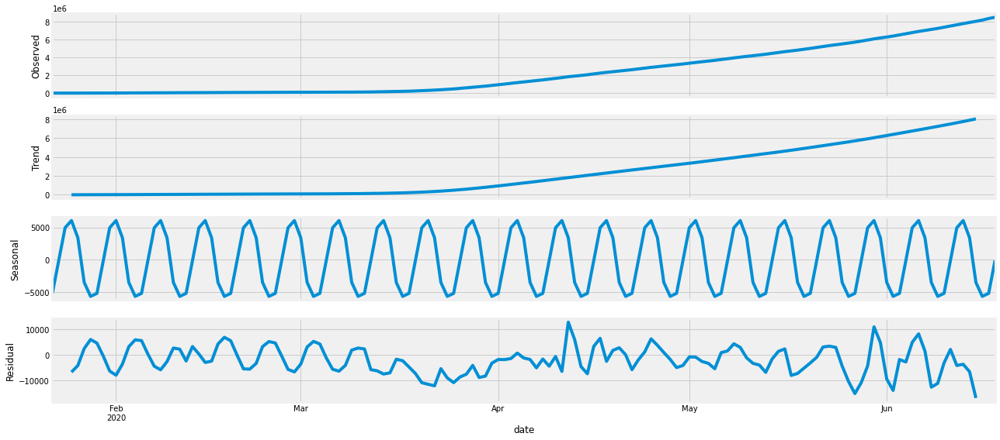

In [88]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(data, model='additive')
fig = decomposition.plot()
plt.show()

In [89]:
import warnings
import itertools
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [90]:
import warnings
warnings.filterwarnings("ignore")
for param in pdq:
  for param_seasonal in seasonal_pdq:
    try:
      mod = sm.tsa.statespace.SARIMAX(data, order=param, seasonal_order= param_seasonal, enforce_stationarity=False,enforce_invertibility=False)
      results =mod.fit()
      print('ARIMA{}x{}12-AIC:{}'.format(param,param_seasonal,results.aic))
    except:
        continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12-AIC:4883.599206455467
ARIMA(0, 0, 0)x(0, 0, 1, 12)12-AIC:6534.84092878728
ARIMA(0, 0, 0)x(0, 1, 0, 12)12-AIC:4104.450888163141
ARIMA(0, 0, 0)x(0, 1, 1, 12)12-AIC:3686.2012494892274
ARIMA(0, 0, 0)x(1, 0, 0, 12)12-AIC:3866.4834663428987
ARIMA(0, 0, 0)x(1, 0, 1, 12)12-AIC:4009.3189712342923
ARIMA(0, 0, 0)x(1, 1, 0, 12)12-AIC:3384.290067881863
ARIMA(0, 0, 0)x(1, 1, 1, 12)12-AIC:3505.569991301273
ARIMA(0, 0, 1)x(0, 0, 0, 12)12-AIC:4743.560025116018
ARIMA(0, 0, 1)x(0, 0, 1, 12)12-AIC:4334.24360363821
ARIMA(0, 0, 1)x(0, 1, 0, 12)12-AIC:3976.499666529907
ARIMA(0, 0, 1)x(0, 1, 1, 12)12-AIC:3771.2133387536883
ARIMA(0, 0, 1)x(1, 0, 0, 12)12-AIC:4389.857939968744
ARIMA(0, 0, 1)x(1, 0, 1, 12)12-AIC:4327.679215095713
ARIMA(0, 0, 1)x(1, 1, 0, 12)12-AIC:3654.855812247795
ARIMA(0, 0, 1)x(1, 1, 1, 12)12-AIC:3598.01093856834
ARIMA(0, 1, 0)x(0, 0, 0, 12)12-AIC:3716.8098547734353
ARIMA(0, 1, 0)x(0, 0, 1, 12)12-AIC:3353.8056610423037
ARIMA(0, 1, 0)x(0, 1, 0, 12)12-AIC:3062.467

ARIMA(1, 1, 1)x(1, 1, 1, 12)12-AIC:2555.8466931507246 gives the lowest AIC

In [91]:
mod = sm.tsa.statespace.SARIMAX(data,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0127      0.009    107.826      0.000       0.994       1.031
ma.L1         -0.2779      0.115     -2.419      0.016      -0.503      -0.053
ar.S.L12       0.0954      0.210      0.455      0.649      -0.316       0.507
ma.S.L12      -1.1161      0.076    -14.713      0.000      -1.265      -0.967
sigma2      1.145e+08   3.46e-10   3.31e+17      0.000    1.15e+08    1.15e+08


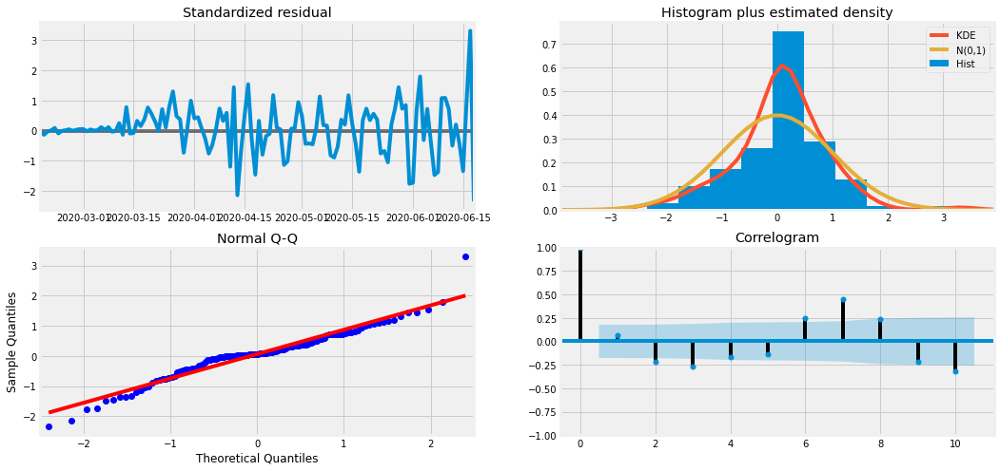

In [92]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

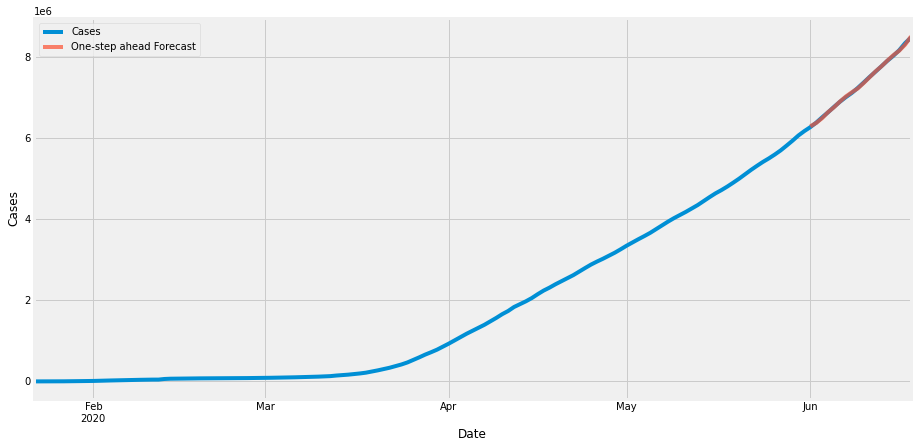

In [93]:
pred = results.get_prediction(start=pd.to_datetime('2020-06-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = data['2020-01-22':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Cases')
plt.legend()
plt.show()

In [94]:
#MSE and RMSE
y_forecasted = pred.predicted_mean
y_truth = data['2020-06-01':]['Cases']
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of our forecasts is 247077141.74
The Root Mean Squared Error of our forecasts is 15718.69


Producing and Visualizing Forecasts

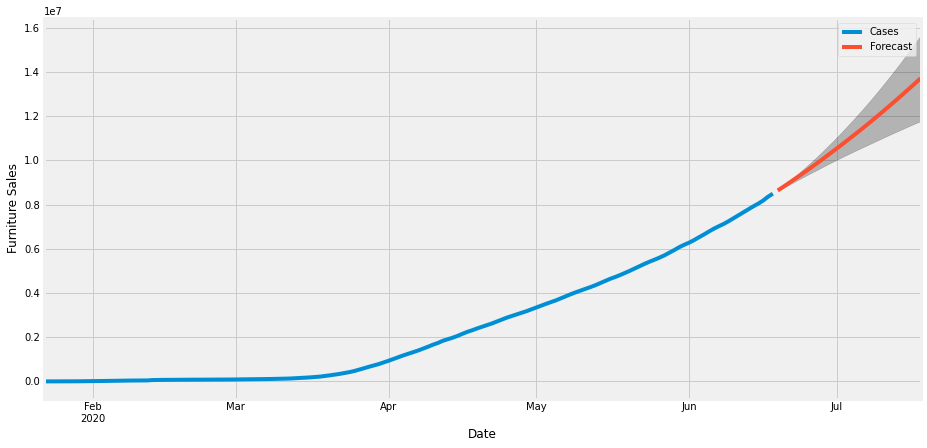

In [95]:
pred_uc = results.get_forecast(steps=30)
pred_ci = pred_uc.conf_int()
ax = data.plot(label='observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Furniture Sales')
plt.legend()
plt.show()

In [96]:
#Next Day's Prediction
pred_uc.predicted_mean[0]

8635645.730143223

**Polynomial Regression**

In [97]:
# transform our data for polynomial regression
poly = PolynomialFeatures(degree=6)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forcast = poly.fit_transform(future_forcast)

In [98]:
# polynomial regression
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
test_linear_pred = linear_model.predict(poly_X_test_confirmed)
linear_pred = linear_model.predict(poly_future_forcast)
print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_linear_pred, y_test_confirmed))
print('RMSE:', sqrt(mean_squared_error(test_linear_pred, y_test_confirmed)) )

MAE: 1084089.4943780622
MSE: 1739364491820.8855
RMSE: 1318849.6850744158


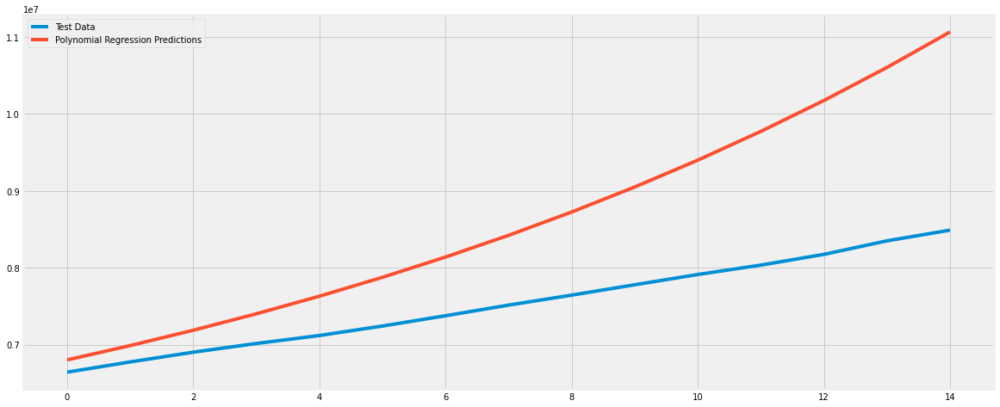

In [99]:
plt.plot(y_test_confirmed)
plt.plot(test_linear_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])

In [100]:
# Future predictions using Polynomial Regression 
linear_pred = linear_pred.reshape(1,-1)[0]
print('Polynomial regression future predictions:')
set(zip(future_forcast_dates[-10:], np.round(linear_pred[-10:])))

Polynomial regression future predictions:


{('06/19/2020', 11557610.0),
 ('06/20/2020', 12085470.0),
 ('06/21/2020', 12650072.0),
 ('06/22/2020', 13253611.0),
 ('06/23/2020', 13898370.0),
 ('06/24/2020', 14586723.0),
 ('06/25/2020', 15321138.0),
 ('06/26/2020', 16104175.0),
 ('06/27/2020', 16938493.0),
 ('06/28/2020', 17826849.0)}

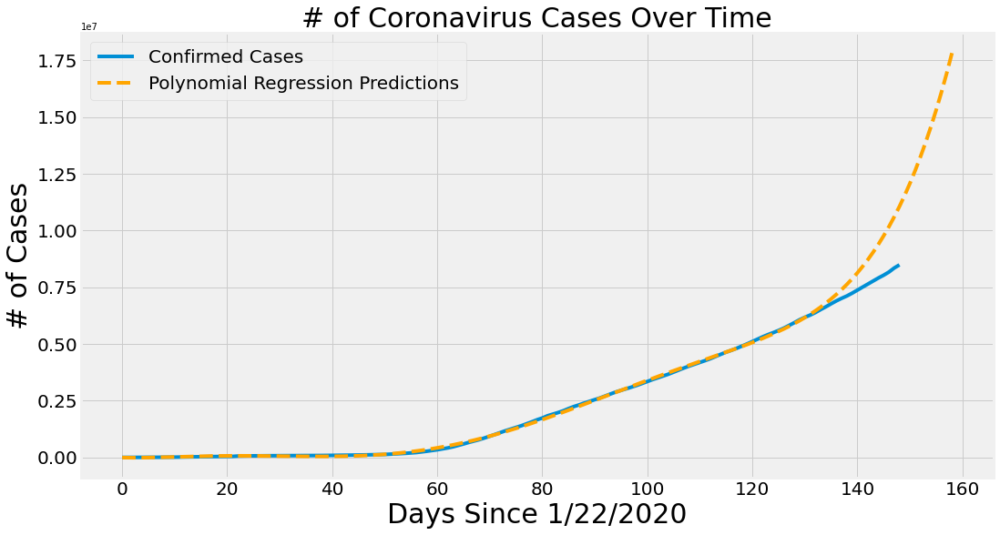

In [101]:
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, world_cases)
plt.plot(future_forcast, linear_pred, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Confirmed Cases', 'Polynomial Regression Predictions'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

**HOLT'S LINEAR TREND MODEL**

In [102]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
train, test = train_test_split(data,test_size = 0.1 ,shuffle=False)
train.head()

,Cases
date,
2020-01-22,555
2020-01-23,654
2020-01-24,941
2020-01-25,1434
2020-01-26,2118


In [103]:
fit = Holt(np.asarray(train['Cases'])).fit(smoothing_level = 0.3,smoothing_slope = 0.1)
test['Holt_linear'] = fit.forecast(len(test))

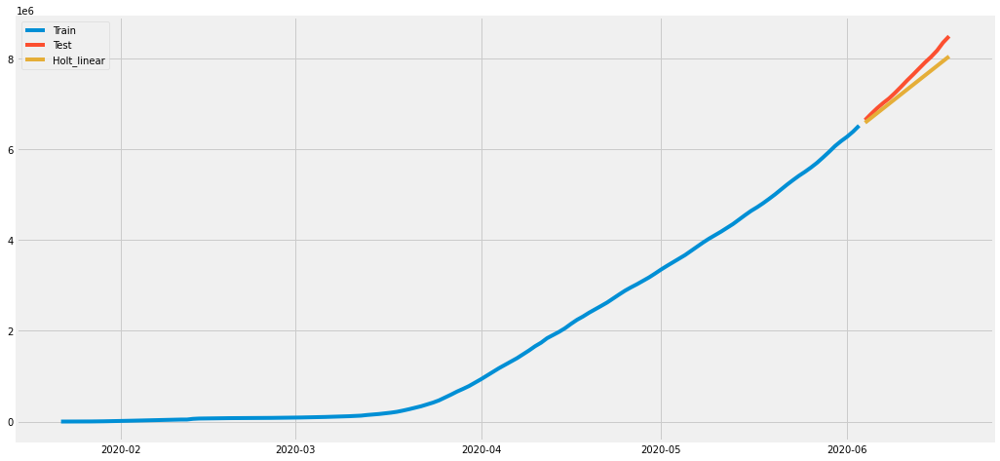

In [104]:
plt.figure(figsize=(16,8))
plt.plot(train['Cases'], label='Train')
plt.plot(test['Cases'], label='Test')
plt.plot(test['Holt_linear'], label='Holt_linear')
plt.legend(loc='best')
plt.show()

In [105]:
mse = mean_squared_error(test.Cases, test.Holt_linear)
rms = sqrt(mean_squared_error(test.Cases, test.Holt_linear))
print(mse)
print(rms)

60034432969.05674
245019.25020099286


**FACEBOOK PROPHET**

In [106]:
from fbprophet import Prophet
fp_df=pd.read_csv('/content/drive/My Drive/ts_r.csv',usecols=[1])

In [107]:
total_cases=pd.DataFrame(world_cases)

In [108]:
fp_df=pd.concat([fp_df,total_cases],axis=1,sort=False)

In [109]:
fp_df

,date,0
0,2020-01-22,555
1,2020-01-23,654
2,2020-01-24,941
3,2020-01-25,1434
4,2020-01-26,2118
...,...,...
144,2020-06-14,7912426
145,2020-06-15,8034461
146,2020-06-16,8173940
147,2020-06-17,8349950


In [110]:
# Prophet requires columns ds (Date) and y (value)
fp_df = fp_df.rename(columns={'date': 'ds', 0: 'y'})
fp_df.head()

,ds,y
0,2020-01-22,555
1,2020-01-23,654
2,2020-01-24,941
3,2020-01-25,1434
4,2020-01-26,2118


In [111]:
# Make the prophet model and fit on the data
fb_prophet = Prophet(yearly_seasonality=False)
fb_prophet.fit(fp_df)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [112]:
# Python
future = fb_prophet.make_future_dataframe(periods=10)
future.tail()

,ds
154,2020-06-24
155,2020-06-25
156,2020-06-26
157,2020-06-27
158,2020-06-28


In [113]:
forecast = fb_prophet.predict(future)
forecast[['ds','yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
149,2020-06-19,8.462113e+06,8.424131e+06,8.501433e+06
150,2020-06-20,8.581226e+06,8.542456e+06,8.616477e+06
151,2020-06-21,8.696263e+06,8.656226e+06,8.732781e+06
152,2020-06-22,8.808011e+06,8.768241e+06,8.846341e+06
153,2020-06-23,8.923631e+06,8.882238e+06,8.968027e+06
154,2020-06-24,9.043952e+06,9.000593e+06,9.087616e+06
155,2020-06-25,9.166808e+06,9.118254e+06,9.213956e+06
156,2020-06-26,9.281767e+06,9.228103e+06,9.338548e+06
157,2020-06-27,9.400880e+06,9.346065e+06,9.461340e+06
158,2020-06-28,9.515917e+06,9.451785e+06,9.577209e+06


In [114]:
# 1 day Prediction
future_day = fb_prophet.make_future_dataframe(periods=1)
future_day.tail()

,ds
145,2020-06-15
146,2020-06-16
147,2020-06-17
148,2020-06-18
149,2020-06-19


In [115]:
forecast_day = fb_prophet.predict(future_day)
forecast_day[['ds','yhat', 'yhat_lower', 'yhat_upper']].tail(1)

,ds,yhat,yhat_lower,yhat_upper
149,2020-06-19,8.462113e+06,8.423603e+06,8.500807e+06


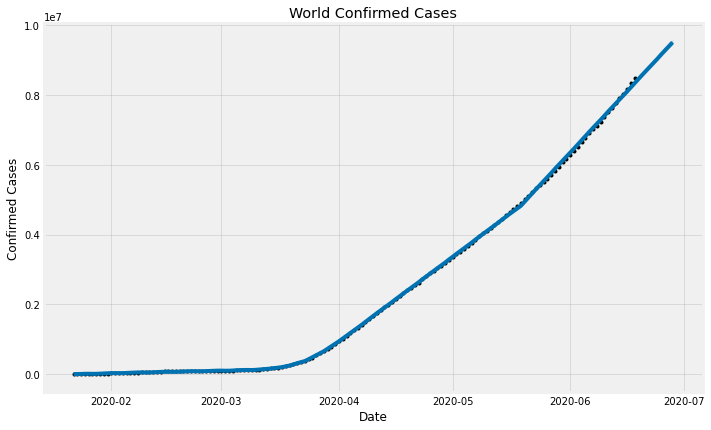

In [116]:
fb_prophet.plot(forecast, xlabel = 'Date', ylabel = 'Confirmed Cases')
plt.title('World Confirmed Cases');

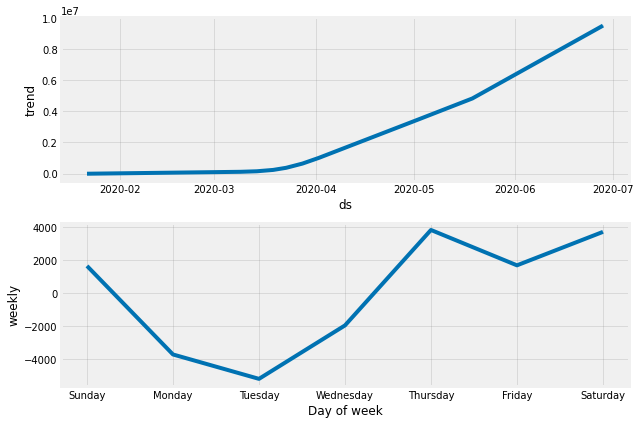

In [117]:
#Components
comp = fb_prophet.plot_components(forecast)

In [118]:
metric_df = forecast.set_index('ds')[['yhat']].join(fp_df.set_index('ds').y).reset_index()

In [119]:
metric_df.dropna(inplace=True)

In [120]:
#Calculating MSE
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
mse= mean_squared_error(metric_df.y, metric_df.yhat)
rmse = sqrt(mean_squared_error(metric_df.y, metric_df.yhat))
print(mse)
print(rmse)

862966181.1168138
29376.286033411605


##**LSTM MODELS**

**Vanilla LSTM**

In [121]:
confirmed_df=world_cases

In [122]:
# univariate data preparation
from numpy import array

# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
	X, y = list(), list()
	for i in range(len(sequence)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the sequence
		if end_ix > len(sequence)-1:
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

In [123]:
# split into train and test sets
train_size = int(len(confirmed_df) * 0.90)
test_size = len(confirmed_df) - train_size
train, test = confirmed_df[0:train_size,:], confirmed_df[train_size:len(confirmed_df),:]

In [124]:
# define input sequence
raw_seq = confirmed_df
# reshape dataset
n_steps = 3
trainX, trainY = split_sequence(train, n_steps)
testX, testY = split_sequence(test, n_steps)

In [125]:
# split into samples
X, y = split_sequence(raw_seq, n_steps)
# summarize the data
for i in range(len(trainX)):
	       (trainX[i], trainY[i])

In [126]:
# reshape from [samples, timesteps] into [samples, timesteps, features]
n_features = 1
trainX = trainX.reshape((trainX.shape[0], trainX.shape[1], n_features))

In [127]:
# define model
from keras.models import Sequential
from keras.layers import Dense,LSTM
from keras.layers.wrappers import TimeDistributed
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [128]:
# fit model
model.fit(trainX, trainY, epochs=200, verbose=0)

In [129]:
# Estimate model performance
trainScore = model.evaluate(trainX, trainY, verbose=0)
print('Train Score: %.2f MSE (%.2f RMSE)' % (trainScore, math.sqrt(trainScore)))
testScore = model.evaluate(testX, testY, verbose=0)
print('Test Score: %.2f MSE (%.2f RMSE)' % (testScore, math.sqrt(testScore)))

Train Score: 2691823402.02 MSE (51882.79 RMSE)
Test Score: 8118756864.00 MSE (90104.14 RMSE)


In [130]:
testY

array([[7015739],
       [7119355],
       [7242692],
       [7376333],
       [7514724],
       [7644260],
       [7778881],
       [7912426],
       [8034461],
       [8173940],
       [8349950],
       [8488976]])

In [131]:
# demonstrate prediction
x_input = array([testY[-3:]])
x_input = x_input.reshape((1, n_steps, n_features))
yhat1 = model.predict(x_input, verbose=0)
yhat1

array([[8728078.]], dtype=float32)

**Stacked LSTM**

In [132]:
# define model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [133]:
# fit model
model.fit(trainX, trainY, epochs=300, verbose=0)

In [134]:
# Estimate model performance
trainScore = model.evaluate(trainX, trainY, verbose=0)
print('Train Score: %.2f MSE (%.2f RMSE)' % (trainScore, math.sqrt(trainScore)))
testScore = model.evaluate(testX, testY, verbose=0)
print('Test Score: %.2f MSE (%.2f RMSE)' % (testScore, math.sqrt(testScore)))

Train Score: 3761730106.63 MSE (61332.94 RMSE)
Test Score: 14132958208.00 MSE (118882.12 RMSE)


In [135]:
# demonstrate prediction
x_input = array([testY[-3:]])
x_input = x_input.reshape((1, n_steps, n_features))
yhat2 = model.predict(x_input, verbose=0)
yhat2

array([[8753810.]], dtype=float32)

**Bidirectional LSTM**

In [136]:
from numpy import array
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Bidirectional
# define model
model = Sequential()
model.add(Bidirectional(LSTM(50, activation='relu'), input_shape=(n_steps, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [137]:
# fit model
model.fit(trainX, trainY, epochs=200, verbose=0)
# Estimate model performance
trainScore = model.evaluate(trainX, trainY, verbose=0)
print('Train Score: %.2f MSE (%.2f RMSE)' % (trainScore, math.sqrt(trainScore)))
testScore = model.evaluate(testX, testY, verbose=0)
print('Test Score: %.2f MSE (%.2f RMSE)' % (testScore, math.sqrt(testScore)))

Train Score: 2158183989.74 MSE (46456.26 RMSE)
Test Score: 4902268928.00 MSE (70016.20 RMSE)


In [138]:
# demonstrate prediction
x_input = array([testY[-3:]])
x_input = x_input.reshape((1, n_steps, n_features))
yhat3 = model.predict(x_input, verbose=0)
yhat3

array([[8708115.]], dtype=float32)

**CNN LSTM**

In [139]:
# univariate cnn lstm example
from numpy import array
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D

In [140]:
# define input sequence
raw_seq = confirmed_df
# reshape dataset
n_steps = 4
trainX, trainY = split_sequence(train, n_steps)
testX, testY = split_sequence(test, n_steps)

In [141]:
# split into samples
X, y = split_sequence(raw_seq, n_steps)
# summarize the data
for i in range(len(trainX)):
			  (trainX[i], trainY[i])

In [142]:
# reshape from [samples, timesteps] into [samples, subsequences, timesteps, features]
n_features = 1
n_seq = 2
n_steps = 2
trainX = trainX.reshape((trainX.shape[0], n_seq, n_steps, n_features))

In [143]:
# reshape from [samples, timesteps] into [samples, subsequences, timesteps, features]
n_features = 1
n_seq = 2
n_steps = 2
testX = testX.reshape((testX.shape[0], n_seq, n_steps, n_features))

In [144]:
# define model
model = Sequential()
model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, n_steps, n_features)))
model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model.add(TimeDistributed(Flatten()))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# fit model
model.fit(trainX, trainY, epochs=500, verbose=0)

In [145]:
# Estimate model performance
trainScore = model.evaluate(trainX, trainY, verbose=0)
print('Train Score: %.2f MSE (%.2f RMSE)' % (trainScore, math.sqrt(trainScore)))
testScore = model.evaluate(testX, testY, verbose=0)
print('Test Score: %.2f MSE (%.2f RMSE)' % (testScore, math.sqrt(testScore)))

Train Score: 2401362954.83 MSE (49003.70 RMSE)
Test Score: 9659857920.00 MSE (98284.58 RMSE)


In [146]:
testY

array([[7119355],
       [7242692],
       [7376333],
       [7514724],
       [7644260],
       [7778881],
       [7912426],
       [8034461],
       [8173940],
       [8349950],
       [8488976]])

In [147]:
# demonstrate prediction
x_input = array([testY[-4:]])
x_input = x_input.reshape((1, n_seq, n_steps, n_features))
yhat4 = model.predict(x_input, verbose=0)
print(yhat4)

[[8730968.]]


**Deep Learning Model using sliding windows method**

Epoch 1/400
 - 0s - loss: 7596902474952.8613
Epoch 2/400
 - 0s - loss: 5003101119365.9082
Epoch 3/400
 - 0s - loss: 2318546790409.8462
Epoch 4/400
 - 0s - loss: 358479391983.1077
Epoch 5/400
 - 0s - loss: 6715405119.4308
Epoch 6/400
 - 0s - loss: 2260479301.2966
Epoch 7/400
 - 0s - loss: 2257290836.7453
Epoch 8/400
 - 0s - loss: 2262185371.9923
Epoch 9/400
 - 0s - loss: 2284493700.5308
Epoch 10/400
 - 0s - loss: 2266090011.9683
Epoch 11/400
 - 0s - loss: 2294360312.9346
Epoch 12/400
 - 0s - loss: 2251907199.7981
Epoch 13/400
 - 0s - loss: 2270239179.5663
Epoch 14/400
 - 0s - loss: 2265245106.2827
Epoch 15/400
 - 0s - loss: 2280641835.3904
Epoch 16/400
 - 0s - loss: 2254695198.4192
Epoch 17/400
 - 0s - loss: 2290115653.4702
Epoch 18/400
 - 0s - loss: 2268921700.3308
Epoch 19/400
 - 0s - loss: 2309699794.3865
Epoch 20/400
 - 0s - loss: 2263422826.5769
Epoch 21/400
 - 0s - loss: 2317836910.3846
Epoch 22/400
 - 0s - loss: 2281087263.8957
Epoch 23/400
 - 0s - loss: 2279027867.3154
Epoch 24/

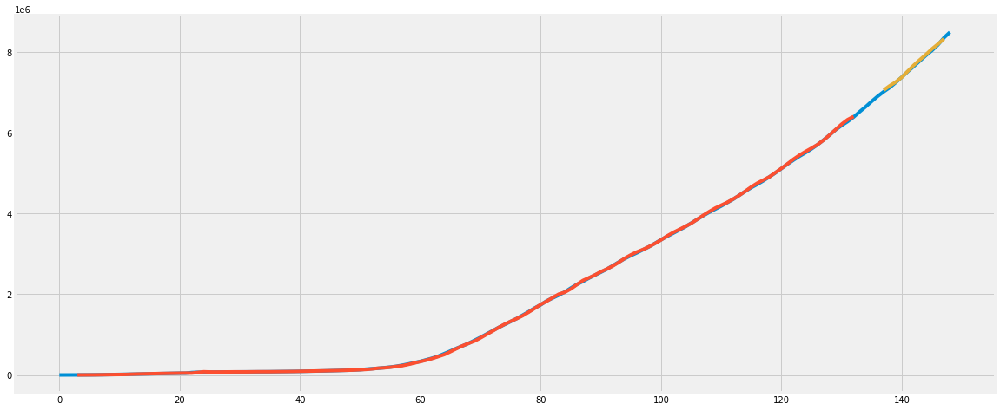

In [148]:
# Multilayer Perceptron to Predict Next days Confirmed Cases (t+1, given t, t-1, t-2)
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense

# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return numpy.array(dataX), numpy.array(dataY)

# load the dataset
dataset = world_cases
dataset = dataset.astype('float32')

# split into train and test sets
train_size = int(len(dataset) * 0.90)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

# reshape dataset
look_back = 3
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

# create and fit Multilayer Perceptron model
model = Sequential()
model.add(Dense(12, input_dim=look_back, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=400, batch_size=2, verbose=2)

# Estimate model performance
trainScore = model.evaluate(trainX, trainY, verbose=0)
print('Train Score: %.2f MSE (%.2f RMSE)' % (trainScore, math.sqrt(trainScore)))
testScore = model.evaluate(testX, testY, verbose=0)
print('Test Score: %.2f MSE (%.2f RMSE)' % (testScore, math.sqrt(testScore)))

# generate predictions for training
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(dataset)
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

In [149]:
testPredict

array([[7055730. ],
       [7162627.5],
       [7254983. ],
       [7373140. ],
       [7524345. ],
       [7672184. ],
       [7805338. ],
       [7933937. ],
       [8072132.5],
       [8192788. ],
       [8325302. ]], dtype=float32)

In [150]:
testY

array([7015739., 7119355., 7242692., 7376333., 7514724., 7644260.,
       7778881., 7912426., 8034461., 8173940., 8349950.], dtype=float32)

**Since Arima gave the least error among all the Models, we will use the future values of Arima to predict next day's value for the DNN Model**

In [151]:
data_values= data.values

In [152]:
predict_values= pred_uc.predicted_mean.values[0:2]
predict_values= predict_values.reshape(2,1)

In [153]:
arima_values= numpy.concatenate((data_values,predict_values))
arima_values.shape

(151, 1)

Epoch 1/400
 - 0s - loss: 2955704747072.7939
Epoch 2/400
 - 0s - loss: 723177516783.9675
Epoch 3/400
 - 0s - loss: 42915208494.6412
Epoch 4/400
 - 0s - loss: 2125893341.4141
Epoch 5/400
 - 0s - loss: 2092345559.8268
Epoch 6/400
 - 0s - loss: 2089204729.2207
Epoch 7/400
 - 0s - loss: 2059778416.8244
Epoch 8/400
 - 0s - loss: 2041245964.2557
Epoch 9/400
 - 0s - loss: 2049908636.6784
Epoch 10/400
 - 0s - loss: 2015754914.9048
Epoch 11/400
 - 0s - loss: 2010428100.0134
Epoch 12/400
 - 0s - loss: 1996292712.9332
Epoch 13/400
 - 0s - loss: 1994534727.2863
Epoch 14/400
 - 0s - loss: 1979080519.9017
Epoch 15/400
 - 0s - loss: 1989770674.8664
Epoch 16/400
 - 0s - loss: 1955889454.6966
Epoch 17/400
 - 0s - loss: 1942539465.3702
Epoch 18/400
 - 0s - loss: 1911707371.1450
Epoch 19/400
 - 0s - loss: 1896453132.6570
Epoch 20/400
 - 0s - loss: 1940083566.1947
Epoch 21/400
 - 0s - loss: 1919878651.5534
Epoch 22/400
 - 0s - loss: 1896334540.6698
Epoch 23/400
 - 0s - loss: 1927486527.1298
Epoch 24/400
 

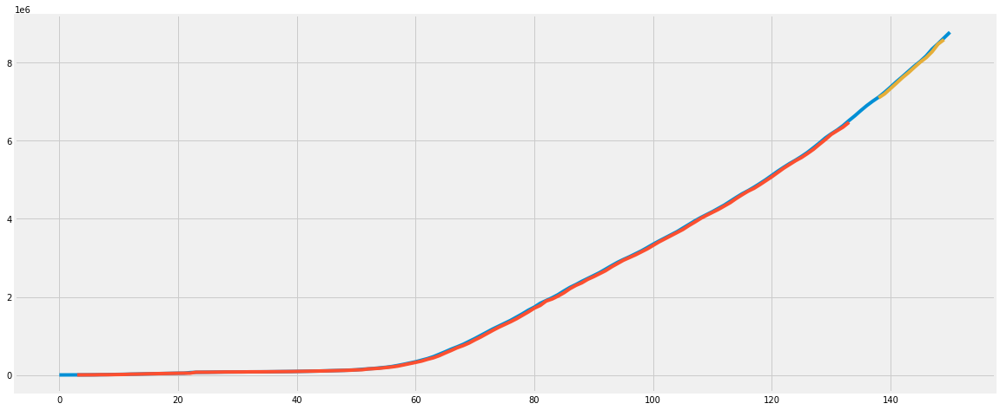

In [154]:
# Multilayer Perceptron to Predict Next days Confirmed Cases (t+1, given t, t-1, t-2)
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense

# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return numpy.array(dataX), numpy.array(dataY)

# load the dataset
dataset = arima_values
dataset = dataset.astype('float32')

# split into train and test sets
train_size = int(len(dataset) * 0.90)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

# reshape dataset
look_back = 3
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

# create and fit Multilayer Perceptron model
model = Sequential()
model.add(Dense(12, input_dim=look_back, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=400, batch_size=2, verbose=2)

# Estimate model performance
trainScore = model.evaluate(trainX, trainY, verbose=0)
print('Train Score: %.2f MSE (%.2f RMSE)' % (trainScore, math.sqrt(trainScore)))
testScore = model.evaluate(testX, testY, verbose=0)
print('Test Score: %.2f MSE (%.2f RMSE)' % (testScore, math.sqrt(testScore)))

# generate predictions for training
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(dataset)
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

In [155]:
#Next Days Prediction
testPredict[-1]

array([8593193.], dtype=float32)

#**Compiling Results**

In [156]:
ar= pd.Series(pred_uc.predicted_mean[0])
ar_df= pd.DataFrame(ar)
fb= pd.Series(forecast_day['yhat'].tail(1))
fb_df= pd.DataFrame(fb)
fb_df= fb_df.rename(columns={"yhat": 0 })
fb_df.rename(index={148:0},inplace=True)
dnn=testPredict[-1].reshape(1,1)
x=np.concatenate((yhat1,yhat2,yhat3,yhat4,dnn))
x.reshape(1,5)
res= pd.DataFrame(x)
results = ar_df.append(fb_df)
results = results.append(res)
results.reset_index(drop=True, inplace=True)
results= results.rename(columns={0 : "Next Day's Prediction"})

In [157]:
model_names = ["Arima", "Facebook Prophet", "Vanilla LSTM", "Stacked LSTM", "Bidirectional LSTM", "CNN LSTM", "DNN"]
models = pd.DataFrame(data= model_names)
models= models.rename(columns={0 : "Models"})

In [158]:
models["Next Day's Prediction"] = results
models["Next Day's Prediction"]= round(models["Next Day's Prediction"],0)

In [159]:
table =models.style.set_properties(**{'text-align': 'center','border-color':'Black','border-width':'thin','border-style':'dotted'})

# **Results**

In [160]:
table

,Models,Next Day's Prediction
0,Arima,8635646.000000
1,Facebook Prophet,8462113.000000
2,Vanilla LSTM,8728078.000000
3,Stacked LSTM,8753810.000000
4,Bidirectional LSTM,8708115.000000
5,CNN LSTM,8730968.000000
6,DNN,8593193.000000
